# Air Quality Foreasting ($CO_2$ emissions) 
## **Business Objective:**
## To forecast $CO_2$ levels for an organization so that the organization can follow government norms with respects to $CO_2$ emission levels.
### Prepare a ppt for each step taken like EDA, Feature Engineering, Model Building,  Model Evaluation and Predicition table, and Deployment. Explaining how many dummy variables you have created and RMSE value for each model. Finally which model you will use for Forecasting.

## All the Lifecycle in a Data Science Project
+ Data Analysis
+ Feature Engineering
+ Feature Extraction
+ Model Building
+ Model Deployment

## Data Analysis Phase
#### Main aim is to understand more about the data


### Importing the libraries required

In [1]:
# Importing 
# Libraries
import dtale

import warnings
%matplotlib inline
import numpy as np
import pandas as pd

from math import sqrt
import seaborn as sns

import missingno as mn
import plotly.io as pio
sns.set_style('darkgrid')

from pandas import Grouper
import scipy.stats as stat
import plotly.express as px
from pandas import DataFrame

import statsmodels.api as smf
import pandas_profiling as pp
import matplotlib.pyplot as plt
from collections import Counter
import plotly.graph_objects as go
import plotly.figure_factory as ff

from pandas.plotting import lag_plot
import statsmodels.formula.api as sm
from plotly.offline import plot as off
from plotly.subplots import make_subplots

from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from sklearn.feature_selection import SelectKBest
from pandas_visual_analysis import VisualAnalysis
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from statsmodels.tsa.seasonal import seasonal_decompose
from dataprep.eda import plot, plot_correlation, plot_missing, create_report

### Importing the Dataset

In [2]:
# Import Dataset
df = pd.read_excel('C:/Users\Moin Dalvi\Documents\Data Science Material\Projects\Air Quality Forecasting/CO2 dataset.xlsx')

In [2]:
data=pd.read_excel('C:/Users\Moin Dalvi\Documents\Data Science Material\Projects\Air Quality Forecasting/CO2 dataset.xlsx'\
                   ,index_col='Year',parse_dates=True)
data

,CO2
Year,
1800-01-01,0.00568
1801-01-01,0.00561
1802-01-01,0.00555
1803-01-01,0.00548
1804-01-01,0.00542
...,...
2010-01-01,15.60000
2011-01-01,15.60000
2012-01-01,14.80000


### Exploratory Data Analysis
### In Time Series Analysis we will analyze to find out the below stuff
+ Missing values
+ Duplicated values
+ Outlier Detection
+ Feature Scaling
+ Feature Extraction
+ Correlation
+ Skewness Removal
+ Data Insights
+ Stationarity Test
+ Autocorrelation Function
+ Partial Autocorrelation Function
+ Lag plots
+ Normal Distribution Analysis
+ Relationshop between independent and dependent feature (CO2)

In [ ]:
create_report(df)

In [ ]:
plot(df)

In [ ]:
plot_correlation(df)

In [ ]:
plot_missing(df)

In [ ]:
EDA_report_ = pp.ProfileReport(df)
EDA_report_.to_file(output_file='EDA_report.html')

In [ ]:
VisualAnalysis(df)

In [ ]:
dtale.show(df)

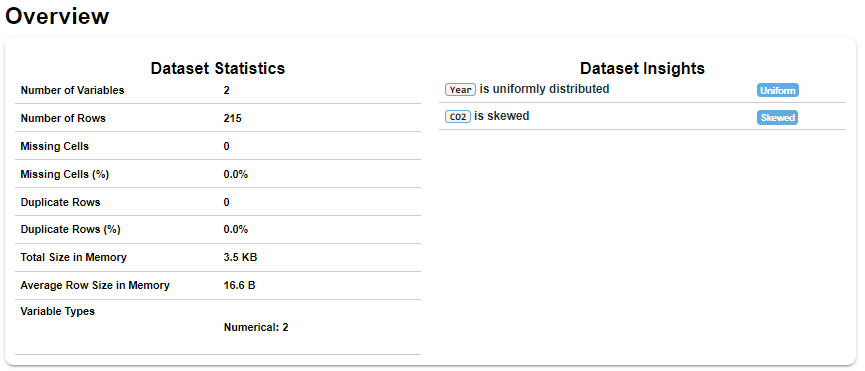

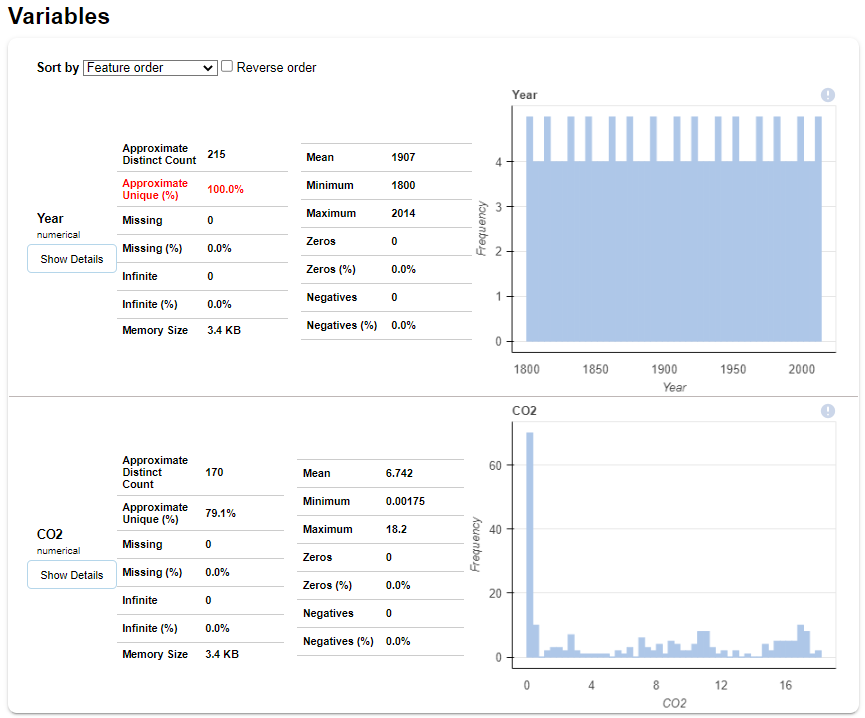

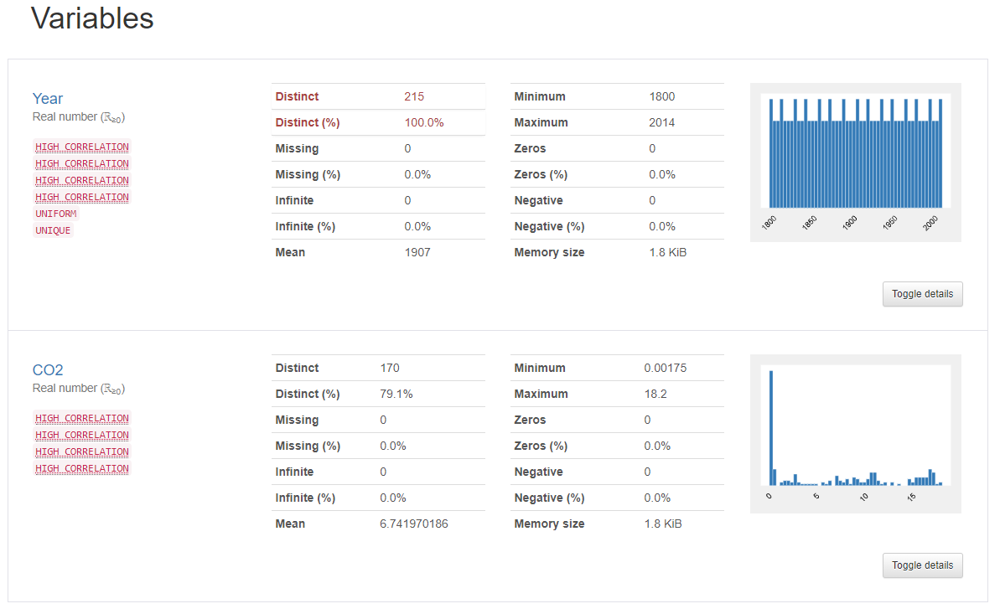

##### Uniform distribution,
In statistics, distribution function in which every possible result is equally likely; that is, the probability of each occurring is the same.

In [3]:
df.duplicated().sum()

0

In [4]:
df[df.duplicated()]

,Year,CO2


In [5]:
df[df.duplicated(keep=False)]

,Year,CO2


#### ^Observation: There are no duplicated values in the dataset

##### ^Observation: As we can see we have 2 columns and 215 rows in our dataset.
+ As our dataset is an time series data our dependent variable is '$CO_2$' which we are going to forecast using 'Year' as our dependent variable.

In [55]:
print("Year starts from {} to {}".format(df.Year[0],df.Year.iloc[-1]))

Year starts from 1800 to 2014


#### ^Observation: As we can see in the 'Year' column we have all the years starting from **`1800`** to **`2014`** in these case we have a total of 200+ years of data in a Yearly format

### Descriptive Analysis

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,215.0,1907.00000,62.209324,1800.00000,1853.50000,1907.00,1960.5,2014.0
CO2,215.0,6.74197,6.522437,0.00175,0.04105,6.39,11.5,18.2


#### ^Observation: As we can observe there are no values as both the column have equal amount of count
+ The mean is greater than median which indicates the data is skewed towards the right.
+ The 'CO2' column has positive skewness
+ The 'CO2' column has negative kurtosis

#### Conclusion: The data is positive skewed, platykurtic and doesn't follow normal distribution 

### Checking for Data types

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 215 entries, 0 to 214
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    215 non-null    int64  
 1   CO2     215 non-null    float64
dtypes: float64(1), int64(1)
memory usage: 3.5 KB


#### ^Observation: all the data types are correct .

### Checking for missing values (Null/Nan values)

In [67]:
df[df['Year']=='?'].any()

Year    False
CO2     False
dtype: bool

In [68]:
df[df['CO2']=='?'].any()

Year    False
CO2     False
dtype: bool

In [69]:
df[df['Year']=='Nan'].any()

Year    False
CO2     False
dtype: bool

In [70]:
df[df['CO2']=='Null'].any()

Year    False
CO2     False
dtype: bool

#### ^Observation: Notice there are no '0' or '?' values in the dataset

In [15]:
df.isnull().sum()

Year    0
CO2     0
dtype: int64

### Visualizing Missing Values

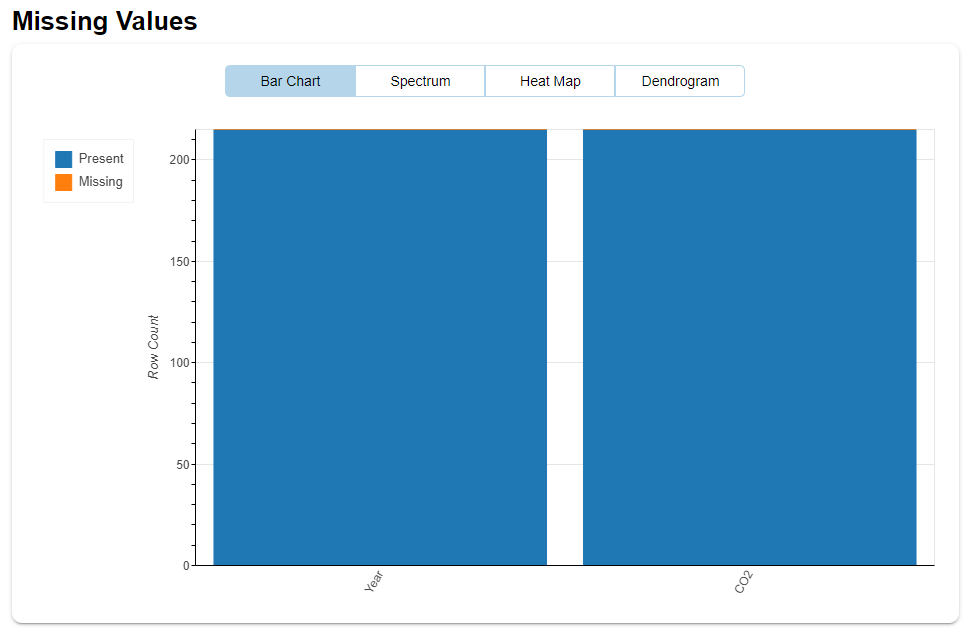

#### ^Observation: None of the Feature has missing Values in the data set
+ We wont have to handle the missing values by observing the distribution and making the optimal choice

#### Analysing the Correlation among the Dependent variable ('CO2') and the Independent Variable ('Year')

In [21]:
df.corr()

,Year,CO2
Year,1.000000,0.951243
CO2,0.951243,1.000000


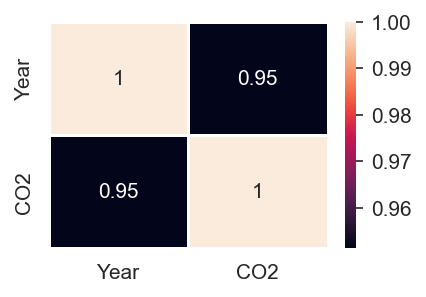

In [39]:
# correlation heatmap

#plt.subplots(figsize=(8,6))
plt.figure(dpi=150, figsize=(3,2))
sns.heatmap(df.corr(), annot=True, linewidths =.5)

plt.show()

#### ^Observation: 'Year' columns is highly correlated with the 'CO2' column

### Outlier detection

#### Box plot and interquartile range

### Extracting Outliers

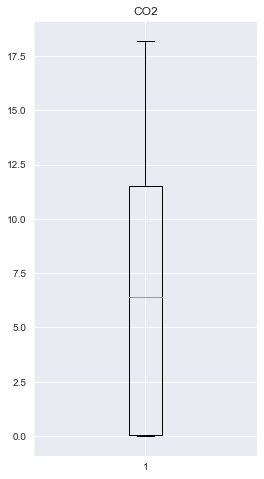

In [81]:
plt.figure(figsize=(4,8))
box = plt.boxplot(df.CO2)
plt.title("CO2")
plt.show()

#### We can see the variable is skewed. So, we will use interquantile range to find outliers.

#### Z score for Outlier Detection 
Z score is an important concept in statistics. Z score is also called standard score. This score helps to understand if a data value is greater or smaller than mean and how far away it is from the mean. More specifically, Z score tells how many standard deviations away a data point is from the mean.

Z score = (x -mean) / std. deviation

+ A normal distribution is shown below and it is estimated that
+ 68% of the data points lie between +/- 1 standard deviation.
+ 95% of the data points lie between +/- 2 standard deviation
+ 99.7% of the data points lie between +/- 3 standard deviation
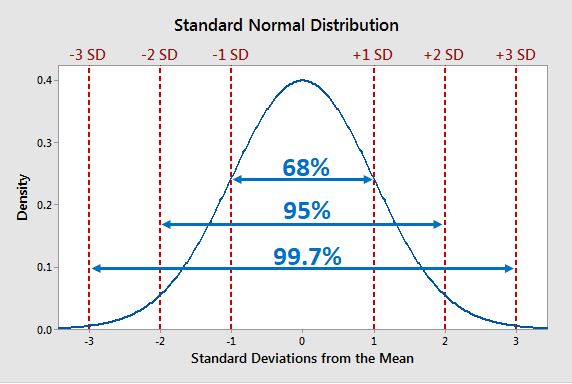

In [3]:
data = df.CO2
mean = np.mean(data)
std = np.std(data)
print('mean of the dataset is', mean)
print('std. deviation is', std)

mean of the dataset is 6.741970186046512
std. deviation is 6.507250716848661


In [5]:
threshold = 3
outlier = []
for i in data:
    z = (i-mean)/std
    if z > threshold:
        outlier.append(i)
    elif z < -(threshold):
        outlier.append(i)
print('outlier in dataset is', outlier)

outlier in dataset is []


In [6]:
threshold = 3
outlier = []
for i in data:
    z = (i-mean)/std
    if z > threshold:
        outlier.append(i)
    elif z < -(threshold):
        outlier.append(i)
if len(outlier) == 0:
        print('No Outlier Found')
else:
        print('outlier in dataset is', outlier)

No Outlier Found


#### ^Observation:
+ There are no outliers above the positive upper extreme whisker.
+ There are no outliers below the negative side of the lower whisker
+ The data looks right skewed which means there are extreme values that do not follow the regular trend of the data

### Univariate Analysis

#### Histogram plot

<AxesSubplot:>

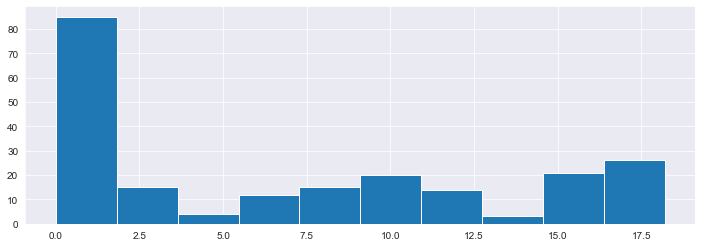

In [71]:
df['CO2'].hist(figsize=(12,4))

<AxesSubplot:xlabel='CO2', ylabel='Density'>

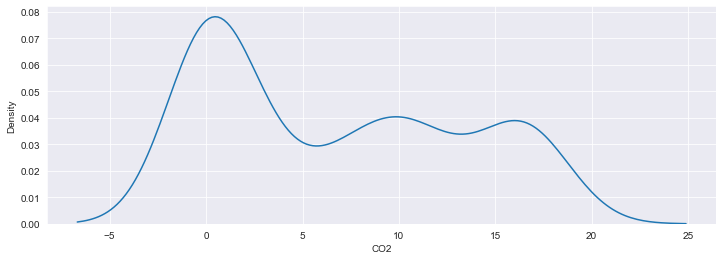

In [8]:
plt.figure(figsize=(12,4))
sns.distplot(df['CO2'], hist=False)

1. We can see that the frequency of the number of CO2 are continious. 
2. As the number of CO2 emission increases, there is no gradual drop in the frequency of that number of CO2 found to be decreasing. 

### Bivariate Analysis

#### Yearly CO2 Analysis

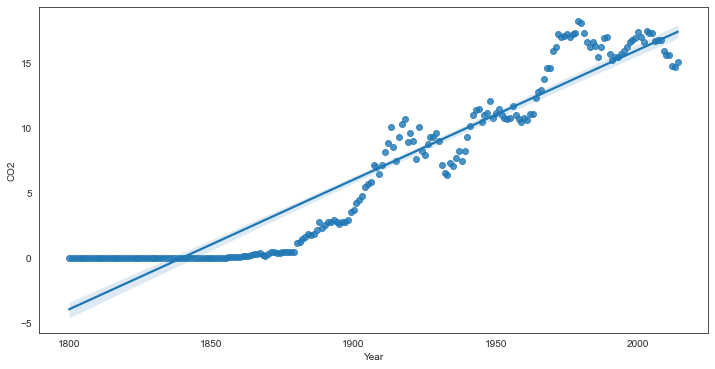

In [72]:
plt.figure(figsize=(12,6))
sns.regplot(df['Year'],df['CO2'])
plt.show()

#### Visualizing and removing insights from the data

##### Observation:^ 
1. We can see that there is an increasing Trend. So, Trend is not constant.
2. Variance is also not constant.

Hence the time series is not stationary.

In [15]:
data=pd.read_excel('C:/Users\Moin Dalvi\Documents\Data Science Material\Projects\Air Quality Forecasting/CO2 dataset.xlsx'\
                   ,index_col='Year',parse_dates=True)
data.head()
data.reset_index(inplace=True)
data["Year"] = pd.to_datetime(data.Year,format="%b-%y")

In [4]:
display(data[data.CO2==data.CO2.min()],
      data[data.CO2==data.CO2.max()])

,Year,CO2
45,1845-01-01,0.00175


,Year,CO2
179,1979-01-01,18.2


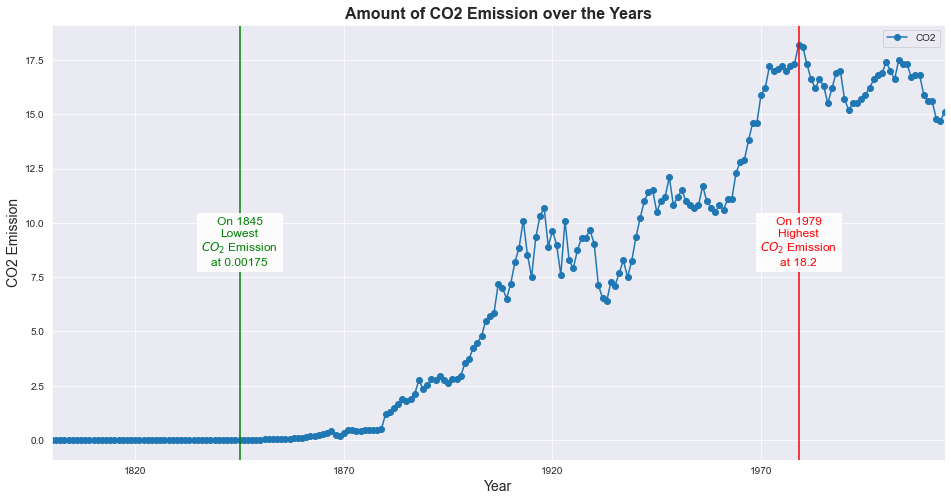

In [63]:
data.plot(kind ='line',x = 'Year', y = 'CO2', figsize = (16,8), marker = 'o')

plt.title('Amount of CO2 Emission over the Years', fontdict={'fontsize': 16,'fontweight':'bold'})
plt.ylabel('CO2 Emission', fontdict={'fontsize': 14})
plt.xlabel('Year', fontdict={'fontsize': 14})

minimum = data[data.CO2==data.CO2.min()]
maximum = data[data.CO2==data.CO2.max()]
minimum.reset_index(inplace=True, drop=True)
minimum = minimum.iat[0,0]
maximum.reset_index(inplace=True, drop=True)
maximum = maximum.iat[0,0]

label_list = [
    (minimum, 'On 1845\nLowest\n$CO_2$ Emission\nat 0.00175', 'g'),
    (maximum, "On 1979\nHighest\n$CO_2$ Emission\nat 18.2", 'r')
]

ax = plt.gca()

for date_point, label, clr in label_list:
    plt.axvline(x=date_point, color=clr)
    plt.text(date_point, ax.get_ylim()[1]-10, label,
             horizontalalignment='center',
             verticalalignment='center',
             color=clr,
             bbox=dict(facecolor='white', alpha=0.9),fontsize=12)

plt.show()
%matplotlib inline

#### ^Observation: As we can observe that approximately after 1845 there is a increase in the amount of CO2 Emission and at  1979 it was at its peak.
+ There has been a significant increase in the amount of CO2 emission after 1870. 
+ With increasing time the amount of emission of CO2 is also increasing. We need to check if there is a trend, seasonality or pattern in our time series.
+ The lowest CO2 emission that was recorded 0.00175 on 1845
+ The highest CO2 that was recorded 18.2 on 1979

#### Lag plot

 A lag plot is a special type of scatter plot in which the X-axis represents the dataset with some time units behind or ahead as compared to the Y-axis. The difference between these time units is called lag or lagged and it is represented by k.

The lag plot contains the following axes:

Vertical axis: Yi for all i
Horizontal axis: Yi-k for all i, where k is lag value
The lag plot is used to answer the following questions:

+ **Distribution of Model:** Distribution of model here means deciding what is the shape of data on the basis of the lag plot. Below are some examples of lag plot and their original plot:
If the lag plot is linear, then the underlying structure is of the autoregressive model.
If the lag plot is of elliptical shape, then the underlying structure represents a continuous periodic function such as sine, cosine, etc.
+ **Outliers:** Outliers are a set of data points that represent the extreme values in the distribution
+ **Randomness in data:** The lag plot is also useful for checking whether the given dataset is random or not. If there is randomness in the data then it will be reflected in the lag plot, if there is no pattern in the lag plot.
+ **Seasonality:** If there is seasonality in the plot then, it will give a periodic lag plot.
+ **Autocorrelation:** If the lag plot gives a linear plot, then it means the autocorrelation is present in the data, whether there is positive autocorrelation or negative that depends upon the slope of the line of the dataset. If more data is concentrated on the diagonal in lag plot, it means there is a strong autocorrelation

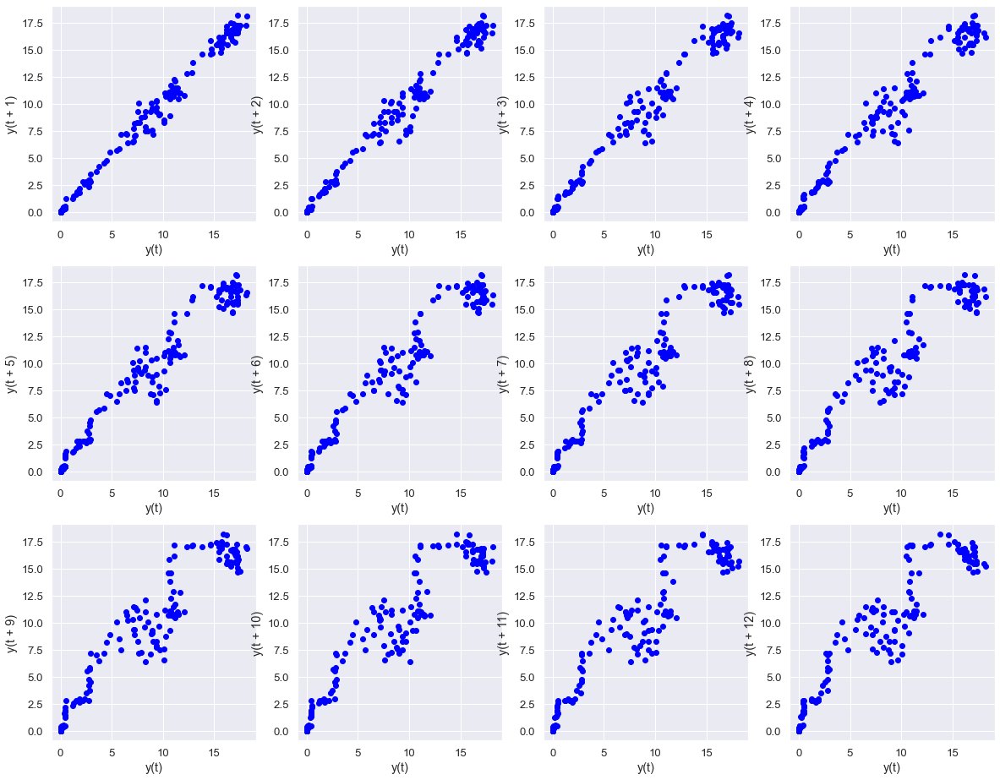

In [42]:
fig, axes = plt.subplots(figsize=(20,16), ncols=4, nrows=3)

lag_plot(df.CO2, lag=1, c = ['blue'][0], ax=axes[0,0])
lag_plot(df.CO2, lag=2, c = ['blue'][0], ax=axes[0,1])
lag_plot(df.CO2, lag=3, c = ['blue'][0], ax=axes[0,2])
lag_plot(df.CO2, lag=4, c = ['blue'][0], ax=axes[0,3])
lag_plot(df.CO2, lag=5, c = ['blue'][0], ax=axes[1,0])
lag_plot(df.CO2, lag=6, c = ['blue'][0], ax=axes[1,1])
lag_plot(df.CO2, lag=7, c = ['blue'][0], ax=axes[1,2])
lag_plot(df.CO2, lag=8, c = ['blue'][0], ax=axes[1,3])
lag_plot(df.CO2, lag=9, c = ['blue'][0], ax=axes[2,0])
lag_plot(df.CO2, lag=10, c = ['blue'][0], ax=axes[2,1])
lag_plot(df.CO2, lag=11, c = ['blue'][0], ax=axes[2,2])
lag_plot(df.CO2, lag=12, c = ['blue'][0], ax=axes[2,3])

plt.show()

#### ^Observation: Our data is linear mostly linear and it shows positive autocorrelation with the previous lag values and it has an underlying structure of and autoregressive model.

### Time Series Decomposition

1) Seasonality
Seasonality is a simple term that means while predicting a time series data there are some months in a particular domain where the output value is at a peak as compared to other months. for example if you observe the data of tours and travels companies of past 3 years then you can see that in November and December the distribution will be very high due to holiday season and festival season. So while forecasting time series data we need to capture this seasonality.

2) Trend
The trend is also one of the important factors which describe that there is certainly increasing or decreasing trend time series, which actually means the value of organization or sales over a period of time and seasonality is increasing or decreasing.

#### Additive Seasonal Decomposition

In [ ]:
data=pd.read_excel('C:/Users\Moin Dalvi\Documents\Data Science Material\Projects\Air Quality Forecasting/CO2 dataset.xlsx'\
                   ,index_col='Year',parse_dates=True)

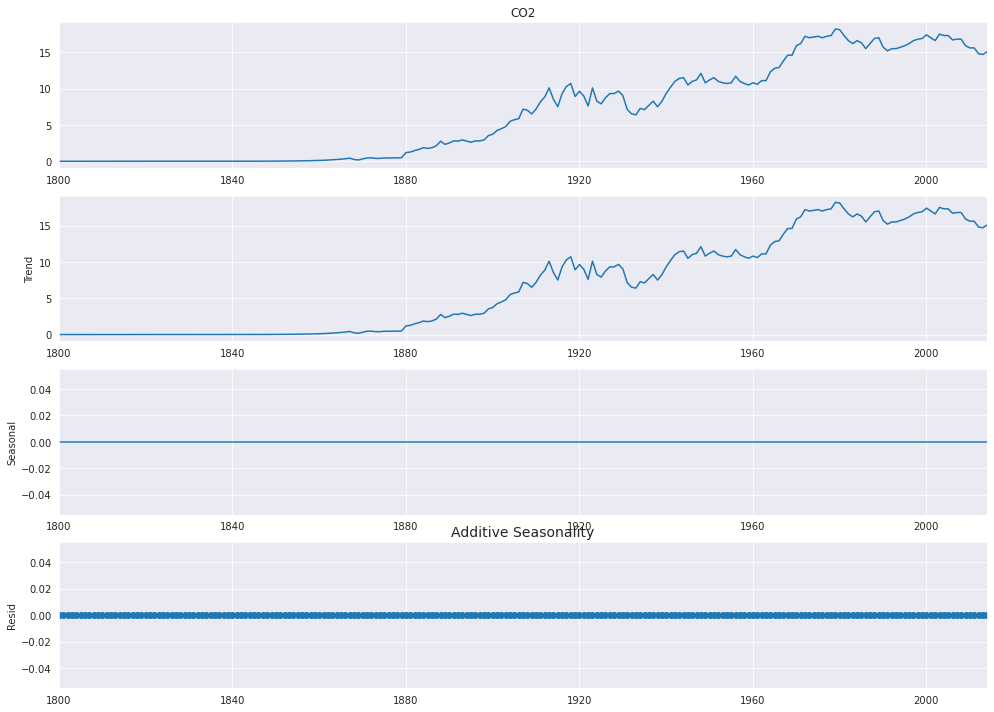

In [85]:
decompose_ts_add = seasonal_decompose(data.CO2, model='additive')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.title('Additive Seasonality', fontsize=14)
    plt.show()

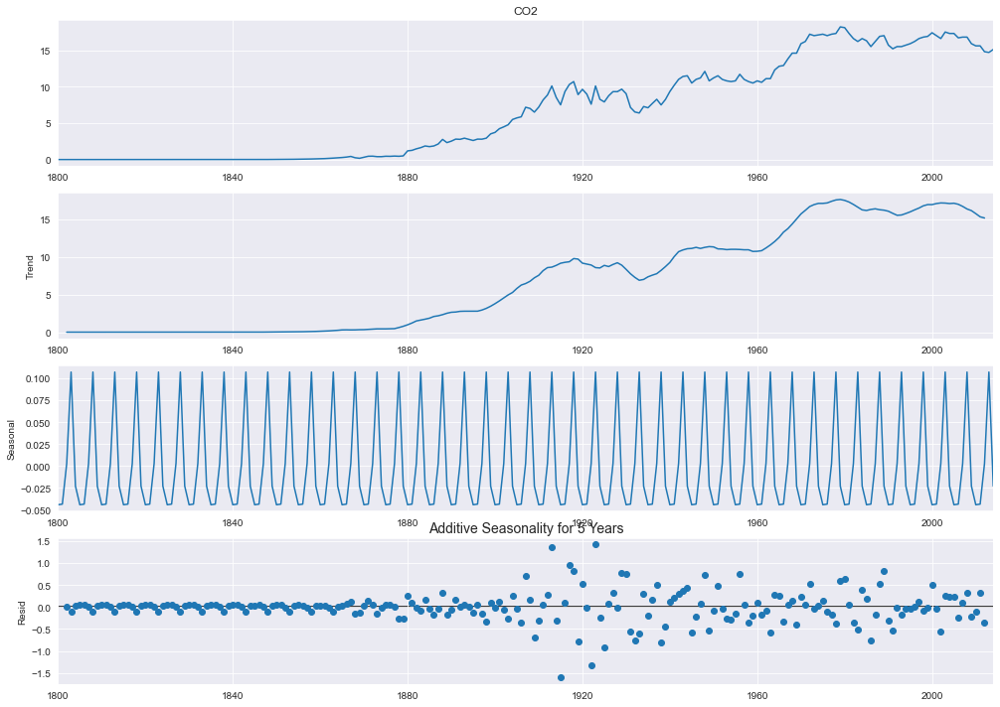

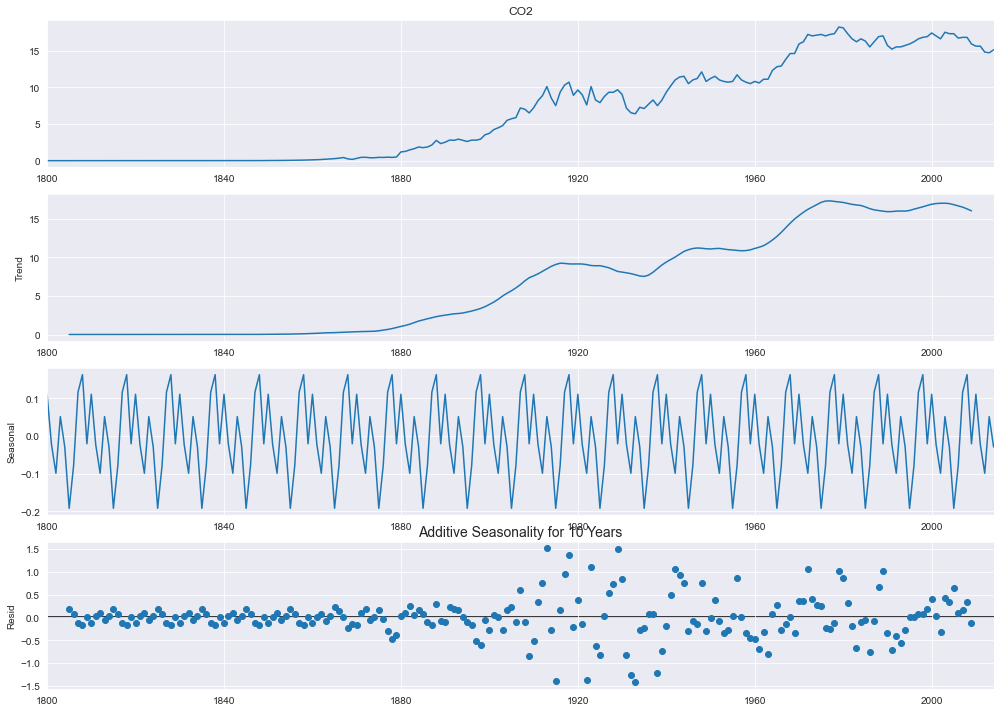

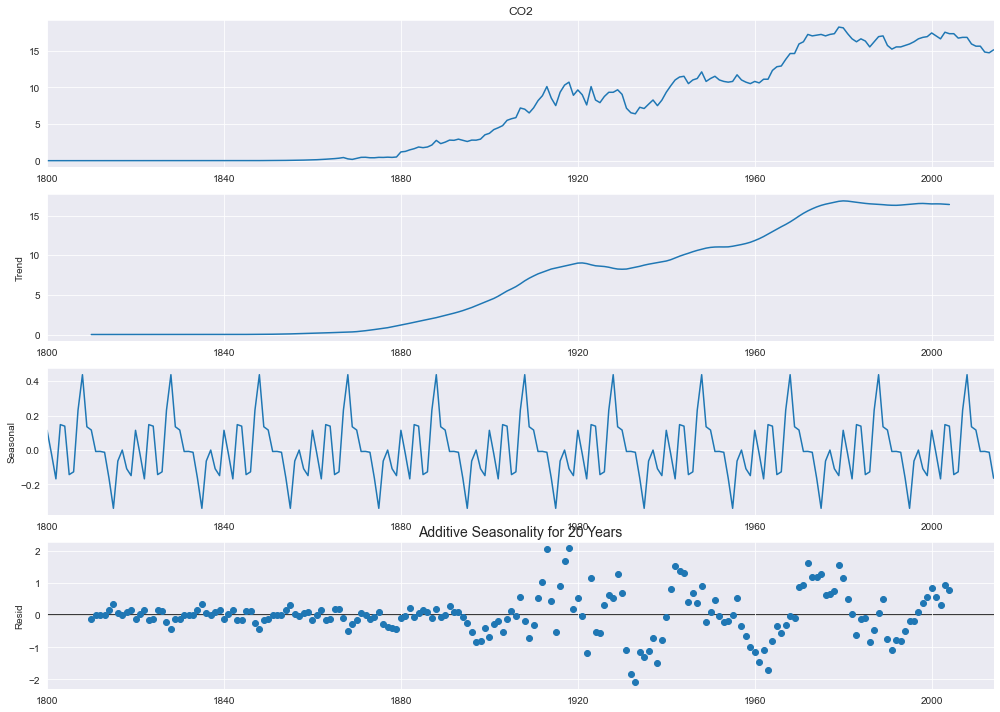

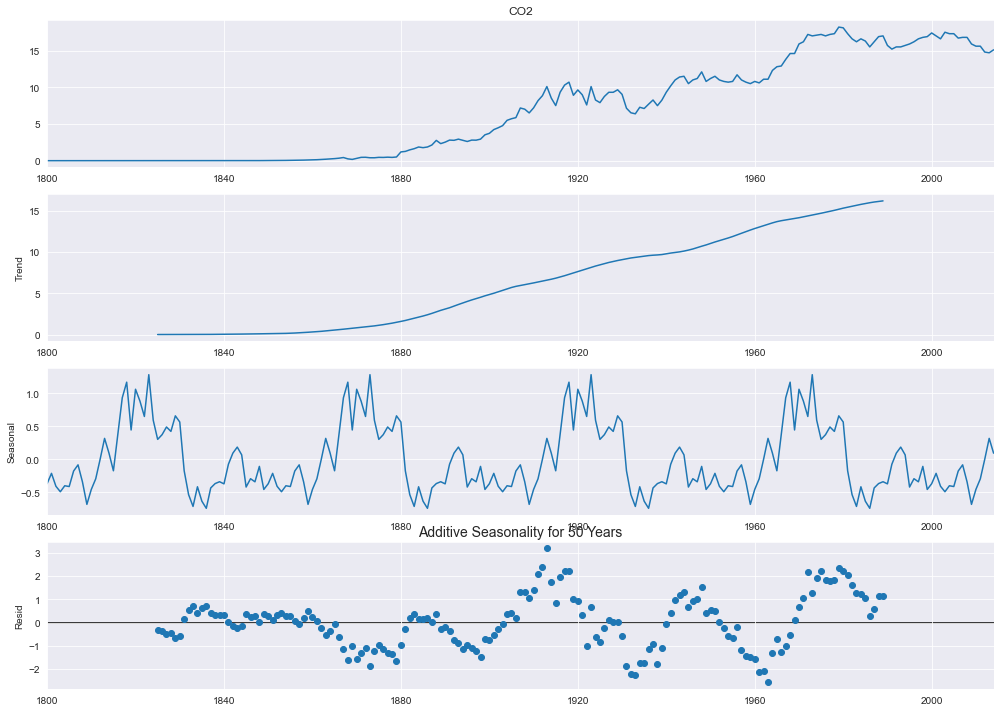

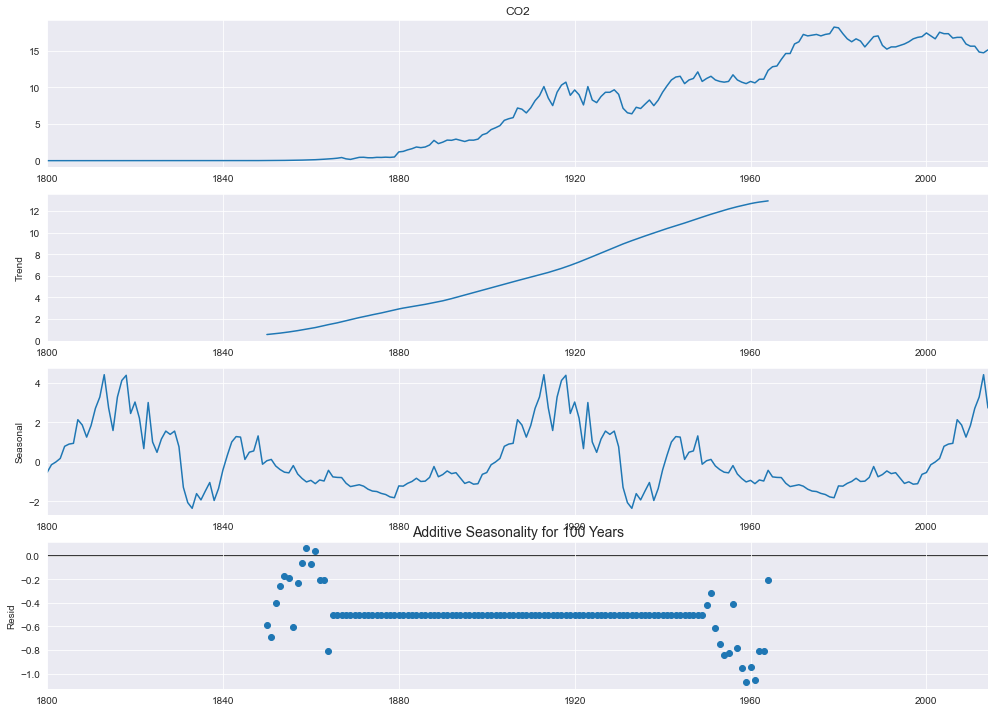

In [18]:
for i in [5, 10, 20, 50, 100]:
    decompose_ts_add = seasonal_decompose(data.CO2, model='additive', period = i)
    with plt.rc_context():
        plt.rc("figure", figsize=(14,10))
        decompose_ts_add.plot()
        plt.title('Additive Seasonality for '+str(i)+' Years', fontsize=14)
        plt.show()

#### Observation:-
1. ***Observed*** - Actual data
2. ***Trend*** - Increasing or decreasing trend.
3. ***Seasonal*** - 
    - Each cycle represents each year trend.
    - The value in the Y-axis has to be `added` to the Trend plot value to get the actual value of that year. 
4. ***Residual*** - It is the noise pattern of the time series data for each year, which was not captured by the two components - Trend and Seasonality. Residual is the left over after decomposition of the two major components (Trend and Seasonality)

#### Multiplicative Seasonal Decomposition

In [86]:
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

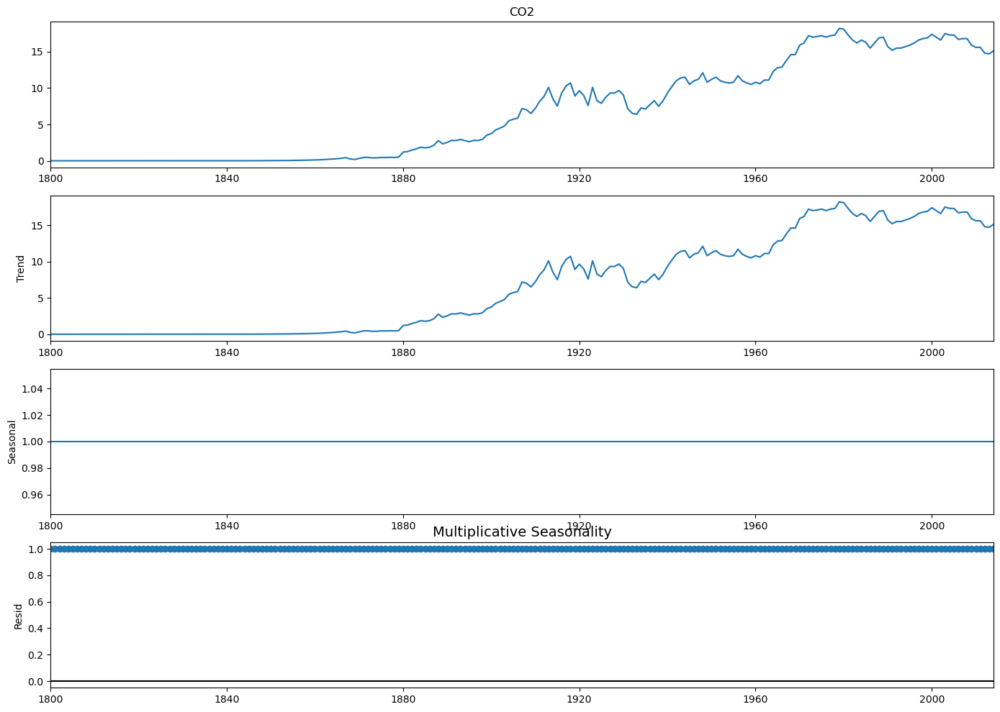

In [87]:
decompose_ts_add = seasonal_decompose(data.CO2, model='multiplicative')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.title('Multiplicative Seasonality', fontsize=14)
    plt.show()

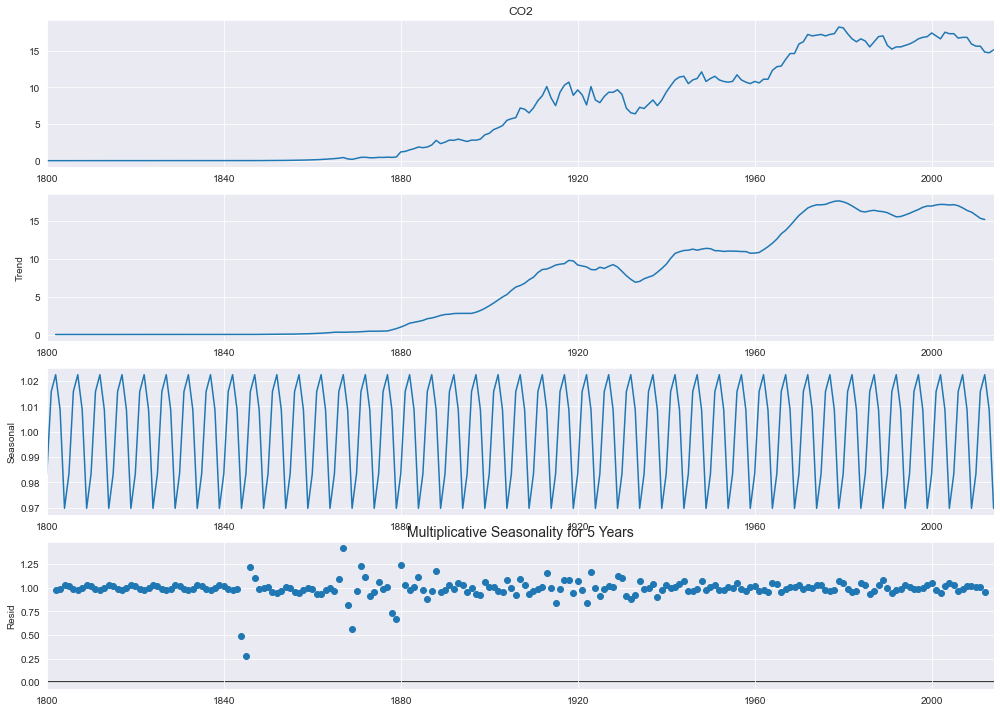

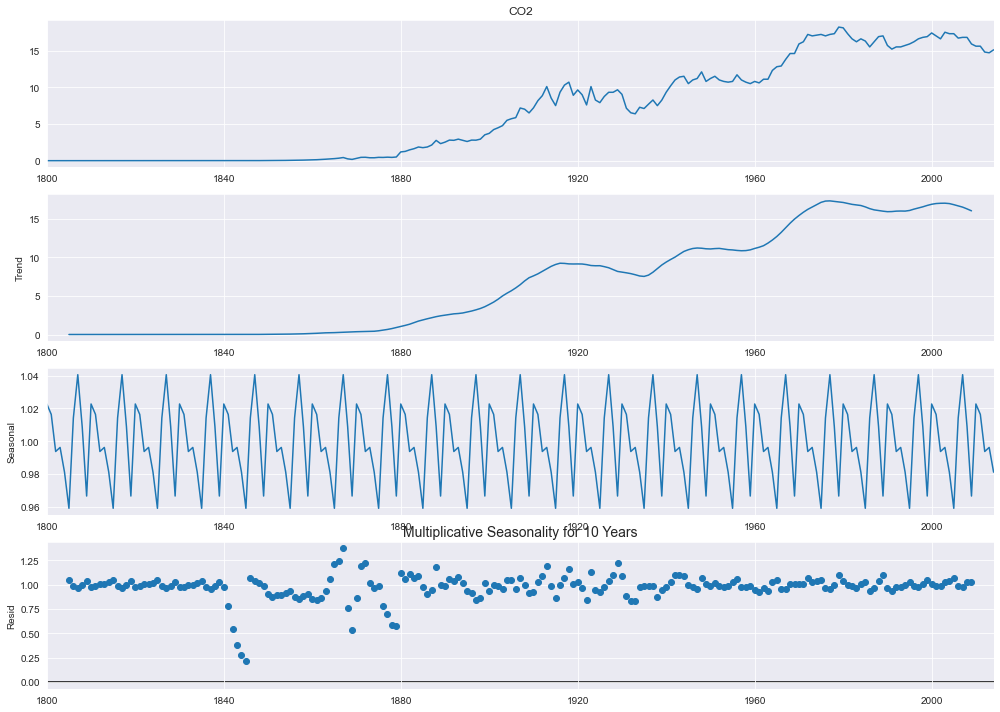

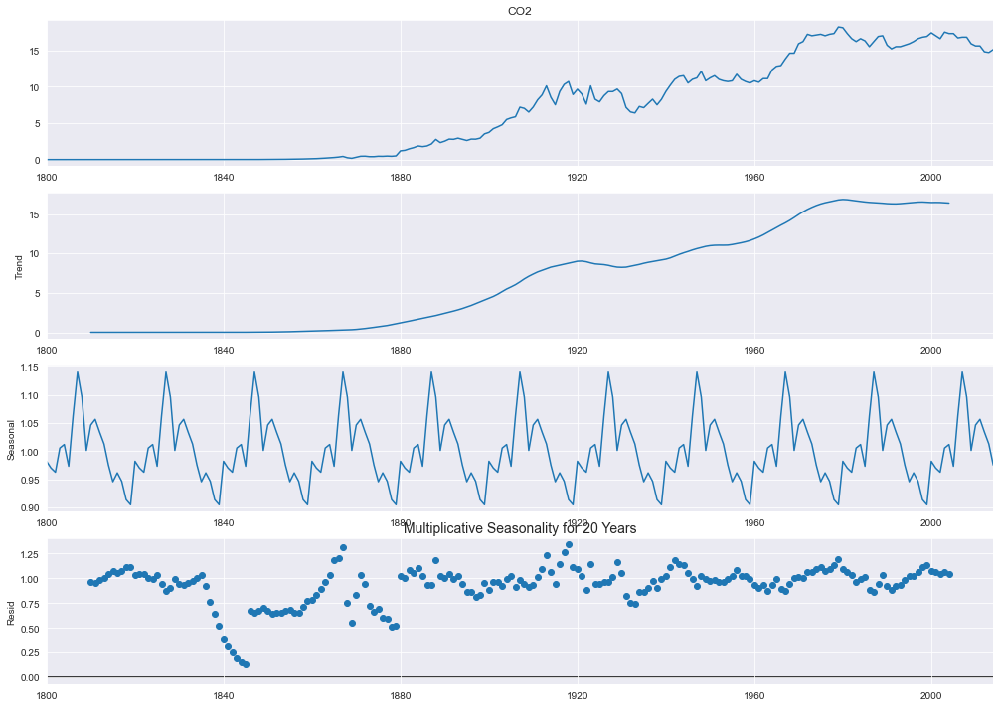

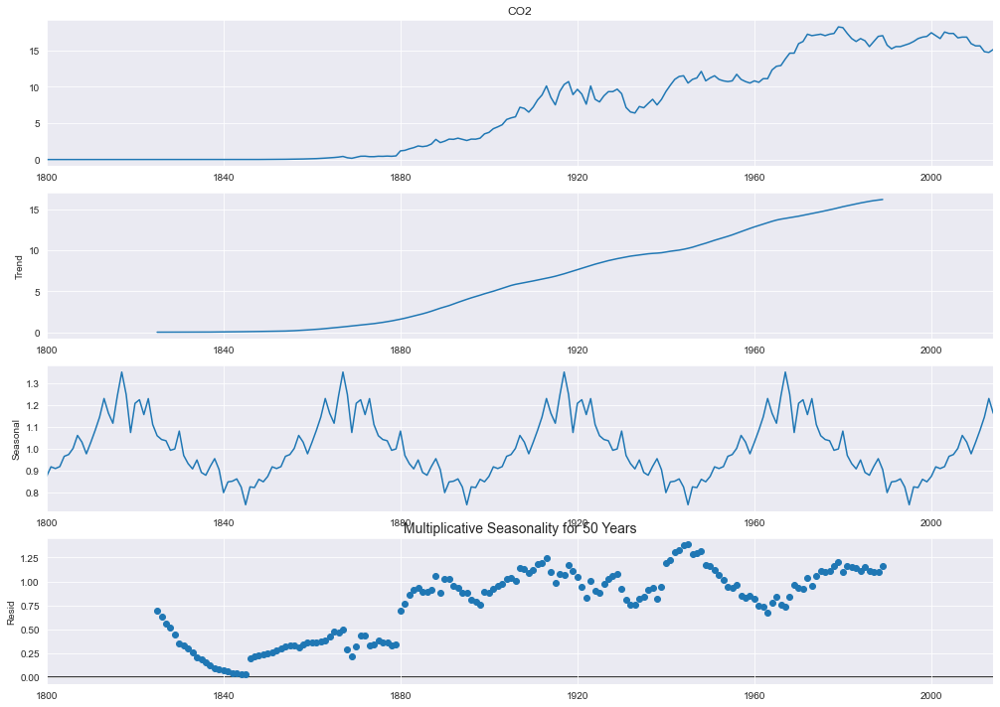

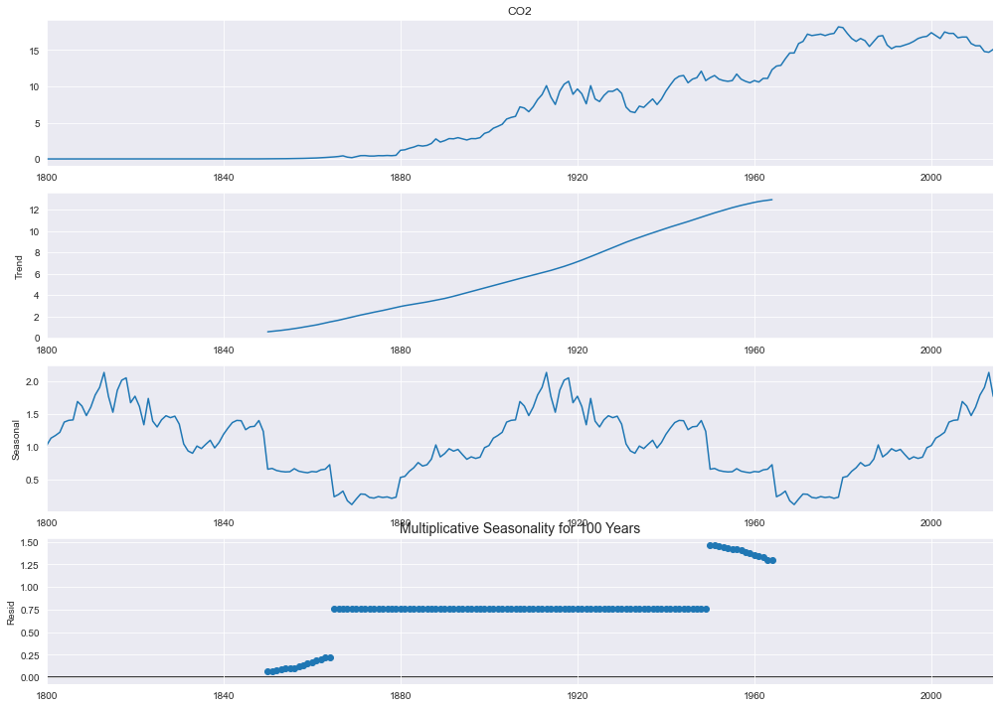

In [19]:
for i in [5, 10, 20, 50, 100]:
    decompose_ts_add = seasonal_decompose(data.CO2, model='multiplicative', period = i)
    with plt.rc_context():
        plt.rc("figure", figsize=(14,10))
        decompose_ts_add.plot()
        plt.title('Multiplicative Seasonality for '+str(i)+' Years', fontsize=14)
        plt.show()

#### ^Observation: As we can see there is an upward trend in the time series Data

### ACF plots and PACF plots

#### Autocorrelation Function (ACF)
The autocorrelation function (ACF) is a statistical technique that we can use to identify how correlated the values in a time series are with each other. The ACF plots the correlation coefficient against the lag, which is measured in terms of a number of periods or units. A lag corresponds to a certain point in time after which we observe the first value in the time series.

The correlation coefficient can range from -1 (a perfect negative relationship) to +1 (a perfect positive relationship). A coefficient of 0 means that there is no relationship between the variables. Also, most often, it is measured either by Pearson’s correlation coefficient or by Spearman’s rank correlation coefficient.

It’s most often used to analyze sequences of numbers from random processes, such as economic or scientific measurements. It can also be used to detect systematic patterns in correlated data sets such as securities prices or climate measurements. Below, we can see an example of the ACF plot:

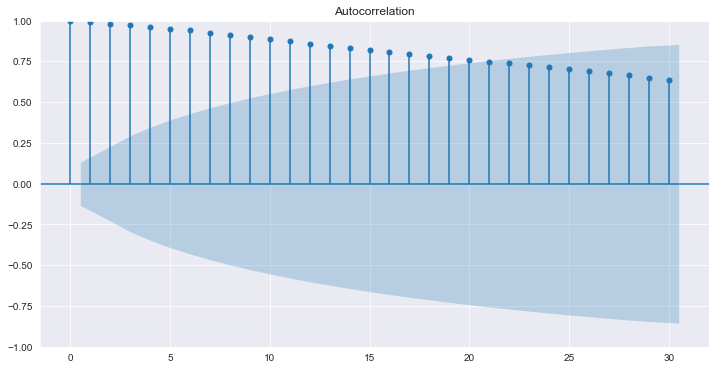

In [20]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,6))
    tsa_plots.plot_acf(df.CO2,lags=30)
    plt.show()

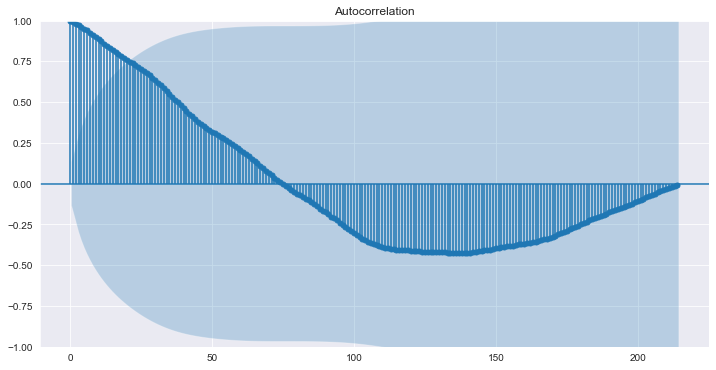

In [31]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,6))
    tsa_plots.plot_acf(df.CO2,lags=214)
    plt.show()

Blue bars on an ACF plot above are the error bands, and anything within these bars is not statistically significant. It means that correlation values outside of this area are very likely a correlation and not a statistical fluke. The confidence interval is set to 95% by default.

Notice that for a lag zero, ACF is always equal to one, which makes sense because the signal is always perfectly correlated with itself.

#### To summarize, autocorrelation is the correlation between a time series (signal) and a delayed version of itself, while the ACF plots the correlation coefficient against the lag, and it’s a visual representation of autocorrelation

#### Partial Autocorrelation Function (PACF)
Partial autocorrelation is a statistical measure that captures the correlation between two variables after controlling for the effects of other variables. For example, if we’re regressing a signal S at lag t ($S_{t}$) with the same signal at lags t-1, t-2 and t-3 ($S_{t-1}, S_{t-2}, S_{t-3}$), the partial correlation between $S_{t}$ and $S_{t-3}$ is the amount of correlation between $S_{t}$ and $S_{t-3}$ that isn’t explained by their mutual correlations with $S_{t-1}$ and $S_{t-2}$.

That being said, the way of finding PACF between $S_{t}$ and $S_{t-3}$ is to use regression model

(1) $\begin{align*} S_{t} = \phi_{1}S_{t-1} + \phi_{2}S_{t-2} + \phi_{3}S_{t-3} + \epsilon \end{align*}$

where  $\phi_{1}$, $\phi_{2}$ and $\phi_{3}$ are coefficients and $\epsilon$ is error. From the regression formula above, the PACF value between $S_{t}$ and $S_{t-3}$ is the coefficient $\pi_{3}$. This coefficient will give us direct effect of time-series $S_{t-3}$ to the time-series $S_{t}$ because the effects of $S_{t-2}$ and $S_{t-1}$ are already captured by
$\phi_{1}$ and $\phi_{2}$.

The figure below presents the PACF plot:

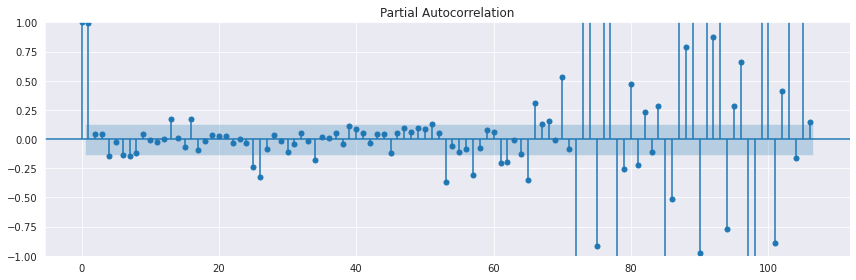

In [125]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_pacf(df.CO2,lags=106)
    plt.show()

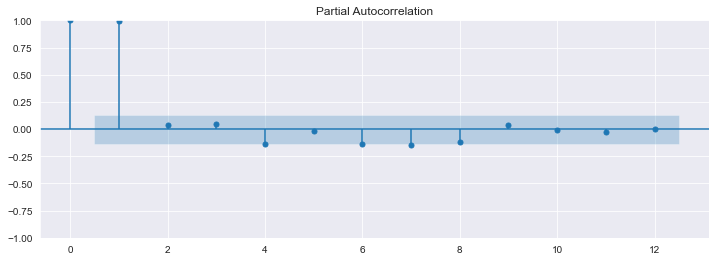

In [32]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_pacf(df.CO2,lags=12)
    plt.show()

#### To summarize, a partial autocorrelation function captures a “direct” correlation between time series and a lagged version of itself.

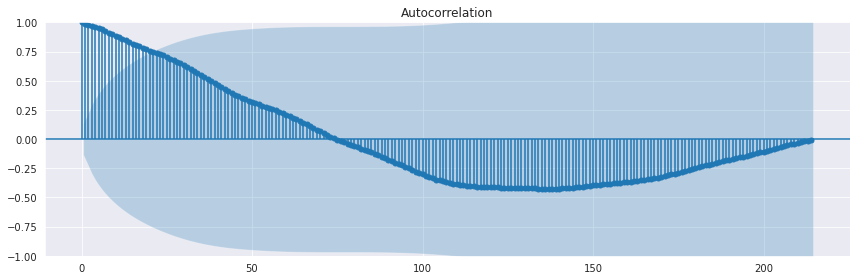

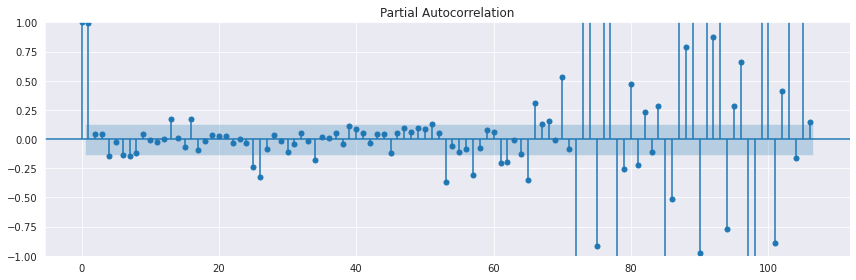

In [126]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_acf(df.CO2,lags=214)
    tsa_plots.plot_pacf(df.CO2,lags=106)
    plt.show()

### Sampling 
### Interpolation
You draw a straight line joining the next and previous points of the missing values in the data.

#### upsampling with respect to month

In [4]:
data=pd.read_excel('C:/Users\Moin Dalvi\Documents\Data Science Material\Projects\Air Quality Forecasting/CO2 dataset.xlsx'\
                   ,index_col='Year',parse_dates=True)

In [5]:
upsampled_month = data.copy()
upsampled_month = upsampled_month.resample('M').mean()
print(upsampled_month.head(13))

                CO2
Year               
1800-01-31  0.00568
1800-02-28      NaN
1800-03-31      NaN
1800-04-30      NaN
1800-05-31      NaN
1800-06-30      NaN
1800-07-31      NaN
1800-08-31      NaN
1800-09-30      NaN
1800-10-31      NaN
1800-11-30      NaN
1800-12-31      NaN
1801-01-31  0.00561


                 CO2
Year                
1800-01-31  0.005680
1800-02-28  0.005674
1800-03-31  0.005668
1800-04-30  0.005662
1800-05-31  0.005657
1800-06-30  0.005651
1800-07-31  0.005645
1800-08-31  0.005639
1800-09-30  0.005633
1800-10-31  0.005628
1800-11-30  0.005622
1800-12-31  0.005616
1801-01-31  0.005610
1801-02-28  0.005605
1801-03-31  0.005600


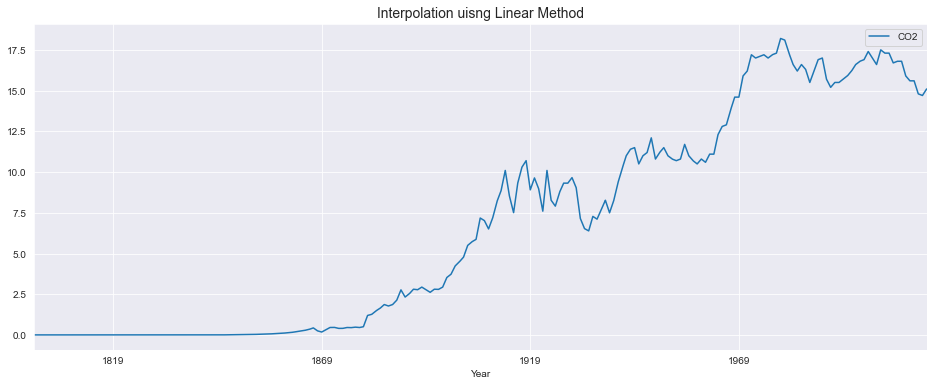

In [6]:
%matplotlib inline
interpolated_month = upsampled_month.interpolate(method='linear') 
## interplation was done for nan values which we get after doing upsampling by month
# ‘linear’: Ignore the index and treat the values as equally spaced. This is the only method supported on MultiIndexes.
print(interpolated_month.head(15))
interpolated_month.plot(figsize=(16,6))
plt.title("Interpolation uisng Linear Method", fontsize =  14)
plt.show()

In [70]:
interpolated_month.duplicated(keep=False).sum()

704

In [71]:
interpolated_month[interpolated_month.duplicated(keep=False)]

,CO2
Year,
1866-07-31,0.391000
1870-07-31,0.391000
1871-01-31,0.461000
1871-09-30,0.467667
1875-01-31,0.461000
...,...
2013-02-28,14.733333
2013-08-31,14.933333
2013-10-31,15.000000


### ACF plots and PACF plots after Interpolation converting data into Monthly CO2 Emission
#### The autocorrelation analysis helps detect patterns and check for randomness. It’s especially important when you intend to use an autoregressive–moving-average (ARMA) model for forecasting because it helps to determine its parameters. 
#### The Auto-Regressive (AR) model assumes that the current value (y_t) is dependent on previous values (y_(t-1), y_(t-2), …). Because of this assumption, we can build a linear regression model.
#### To figure out the order of an AR model, you need to look at the PACF.
#### The Moving Average (MA) model assumes that the current value (y_t) is dependent on the error terms including the current error (𝜖_t, 𝜖_(t-1),…). Because error terms are random, there’s no linear relationship between the current value and the error terms
#### To figure out the order of an MA model, you need to look at the ACF.
**From 1800 to 2014, we have a monthly CO2 Emission dataset. Autocorrelation can be used to answer questions such as “How connected is this month’s emission with emission in the previous month?” The lag value of 1 is indicated by the prior month.**

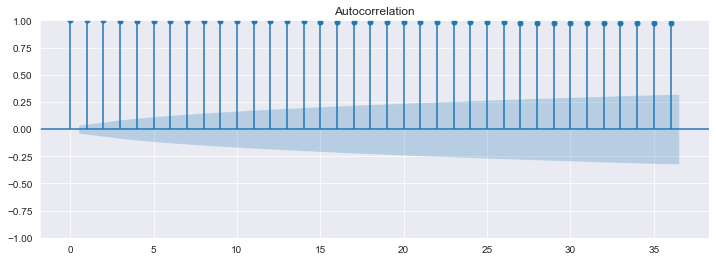

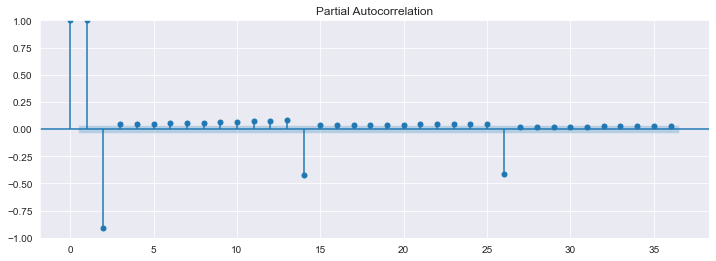

In [36]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_acf(interpolated_month.CO2,lags=36)
    tsa_plots.plot_pacf(interpolated_month.CO2,lags=36, method = "ols")
    plt.show()

##### Additionally, you can see a blue area in the ACF and PACF plots. This blue area depicts the 95% confidence interval and is an indicator of the significance threshold. That means, anything within the blue area is statistically close to zero and anything outside the blue area is statistically non-zero

#### The above validates the assumption that how the emission is correlated to the previous 12 lags and next 12 lags emission and so on. The relation inside the shaded area is something that is statistically irrelevant.

### Lag plot after Sampling the Yearly Time Series into Monthly Time series using Interpolation 

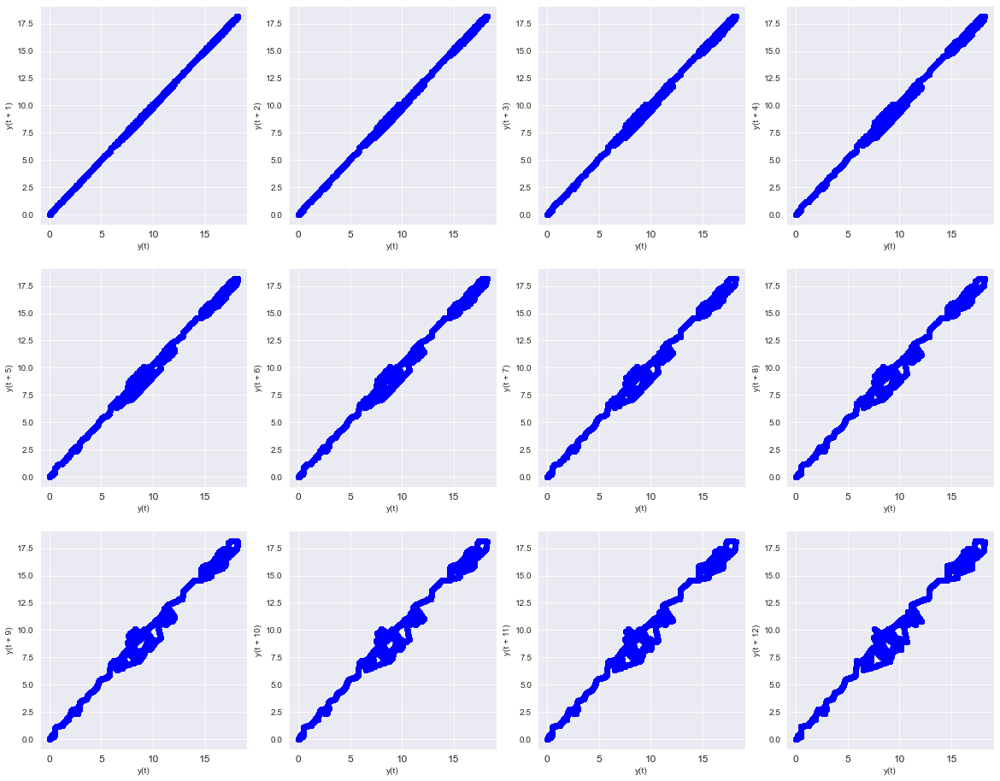

In [26]:
fig, axes = plt.subplots(figsize=(20,16), ncols=4, nrows=3)

lag_plot(interpolated_month.CO2, lag=1, c = ['blue'][0], ax=axes[0,0])
lag_plot(interpolated_month.CO2, lag=2, c = ['blue'][0], ax=axes[0,1])
lag_plot(interpolated_month.CO2, lag=3, c = ['blue'][0], ax=axes[0,2])
lag_plot(interpolated_month.CO2, lag=4, c = ['blue'][0], ax=axes[0,3])
lag_plot(interpolated_month.CO2, lag=5, c = ['blue'][0], ax=axes[1,0])
lag_plot(interpolated_month.CO2, lag=6, c = ['blue'][0], ax=axes[1,1])
lag_plot(interpolated_month.CO2, lag=7, c = ['blue'][0], ax=axes[1,2])
lag_plot(interpolated_month.CO2, lag=8, c = ['blue'][0], ax=axes[1,3])
lag_plot(interpolated_month.CO2, lag=9, c = ['blue'][0], ax=axes[2,0])
lag_plot(interpolated_month.CO2, lag=10, c = ['blue'][0], ax=axes[2,1])
lag_plot(interpolated_month.CO2, lag=11, c = ['blue'][0], ax=axes[2,2])
lag_plot(interpolated_month.CO2, lag=12, c = ['blue'][0], ax=axes[2,3])

plt.show()

### Interpolation using Polynomial Method

                 CO2
Year                
1800-01-31  0.005680
1800-02-28  0.005672
1800-03-31  0.005664
1800-04-30  0.005657
1800-05-31  0.005650
1800-06-30  0.005644
1800-07-31  0.005638
1800-08-31  0.005633
1800-09-30  0.005628
1800-10-31  0.005624
1800-11-30  0.005619
1800-12-31  0.005615
1801-01-31  0.005610
1801-02-28  0.005606
1801-03-31  0.005601


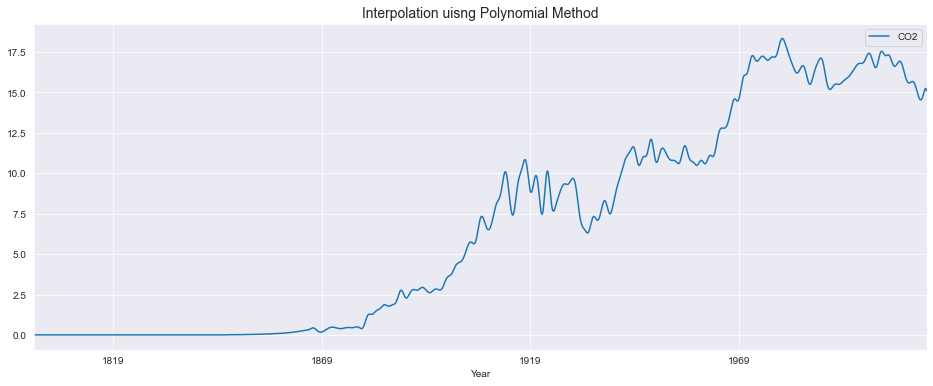

In [5]:
polynomial = upsampled_month.interpolate(method='polynomial', order=5) 
## interplation was done for nan values which we get after doing upsampling by month
print(polynomial.head(15))
polynomial.plot(figsize=(16,6))
plt.title("Interpolation uisng Polynomial Method", fontsize =  14)
plt.show()

### Interpolation using Time Method

                 CO2
Year                
1800-01-31  0.005680
1800-02-28  0.005675
1800-03-31  0.005669
1800-04-30  0.005663
1800-05-31  0.005657
1800-06-30  0.005651
1800-07-31  0.005645
1800-08-31  0.005639
1800-09-30  0.005634
1800-10-31  0.005628
1800-11-30  0.005622
1800-12-31  0.005616
1801-01-31  0.005610
1801-02-28  0.005605
1801-03-31  0.005600


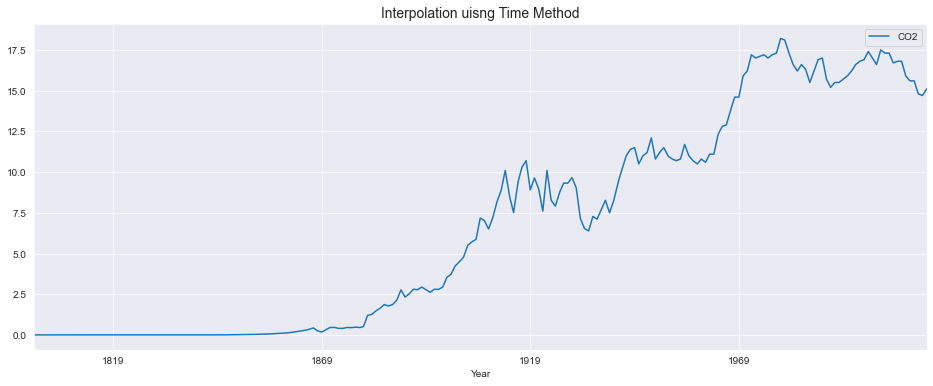

In [5]:
time = upsampled_month.interpolate(method='time') 
## interplation was done for nan values which we get after doing upsampling by month
# ‘time’:  Works on daily and higher resolution data to interpolate given length of interval.
print(time.head(15))
time.plot(figsize=(16,6))
plt.title("Interpolation uisng Time Method", fontsize =  14)
plt.show()

In [8]:
time[time.duplicated(keep=False)]

,CO2
Year,
1871-01-31,0.461
1875-01-31,0.461
1884-01-31,1.870
1886-01-31,1.870
1891-01-31,2.810
...,...
2010-09-30,15.600
2010-10-31,15.600
2010-11-30,15.600


In [12]:
time.to_csv('Interpolated_CO2_dataset.csv')

### Feature Extraction for Visualization

#### Feature extraction using the 'Year' Column

In [7]:
visual = interpolated_month.copy()
visual.reset_index(inplace=True)
visual['Year'] = pd.to_datetime(visual['Year'])
visual['year'] = visual['Year'].dt.year
visual['month'] = visual['Year'].dt.month
visual['week'] = visual['Year'].dt.isocalendar().week
visual['quarter'] = visual['Year'].dt.quarter
visual['day_of_week'] = visual['Year'].dt.day_name()
visual.drop('Year', axis =1 , inplace= True)
visual

,CO2,year,month,week,quarter,day_of_week
0,0.005680,1800,1,5,1,Friday
1,0.005674,1800,2,9,1,Friday
2,0.005668,1800,3,14,1,Monday
3,0.005662,1800,4,18,2,Wednesday
4,0.005657,1800,5,22,2,Saturday
...,...,...,...,...,...,...
2564,14.966667,2013,9,40,3,Monday
2565,15.000000,2013,10,44,4,Thursday
2566,15.033333,2013,11,48,4,Saturday
2567,15.066667,2013,12,1,4,Tuesday


In [14]:
visual.to_csv('Visual_CO2.csv', index=False)

In [15]:
pd.read_csv('Visual_CO2.csv')

,CO2,year,month,week,quarter,day_of_week
0,0.005680,1800,1,5,1,Friday
1,0.005674,1800,2,9,1,Friday
2,0.005668,1800,3,14,1,Monday
3,0.005662,1800,4,18,2,Wednesday
4,0.005657,1800,5,22,2,Saturday
...,...,...,...,...,...,...
2564,14.966667,2013,9,40,3,Monday
2565,15.000000,2013,10,44,4,Thursday
2566,15.033333,2013,11,48,4,Saturday
2567,15.066667,2013,12,1,4,Tuesday


In [ ]:
# data
import calendar
df_m_sa = visual.groupby('month').agg({"CO2" : "mean"}).reset_index()
df_m_sa['CO2'] = round(df_m_sa['CO2'],2)
df_m_sa['month_text'] = df_m_sa['month'].apply(lambda x: calendar.month_abbr[x])
df_m_sa['text'] = df_m_sa['month_text'] + ' - ' + df_m_sa['CO2'].astype(str) 

df_w_sa = visual.groupby('week').agg({"CO2" : "mean"}).reset_index() 
df_q_sa = visual.groupby('quarter').agg({"CO2" : "mean"}).reset_index() 
# chart color
df_m_sa['color'] = '#496595'
df_m_sa['color'][:-1] = '#c6ccd8'
df_w_sa['color'] = '#c6ccd8'

# chart
fig = make_subplots(rows=2, cols=2, vertical_spacing=0.08,
                    row_heights=[0.7, 0.3], 
                    specs=[[{"type": "bar"}, {"type": "pie"}],
                           [{"colspan": 2}, None]],
                    column_widths=[0.7, 0.3],
                    subplot_titles=("Month wise Average", "Quarter wise Average", 
                                    "Week wise Average"))

fig.add_trace(go.Bar(x=df_m_sa['CO2'], y=df_m_sa['month'], marker=dict(color= df_m_sa['color']),
                     text=df_m_sa['text'],textposition='auto',
                     name='Month', orientation='h'), 
                     row=1, col=1)
fig.add_trace(go.Pie(values=df_q_sa['CO2'], labels=df_q_sa['quarter'], name='Quarter',
                     marker=dict(colors=['#334668','#496595','#6D83AA','#91A2BF','#C8D0DF']), hole=0.7,
                     hoverinfo='label+percent+value', textinfo='label+percent'), 
                     row=1, col=2)
fig.add_trace(go.Scatter(x=df_w_sa['week'], y=df_w_sa['CO2'], mode='lines+markers', fill='tozeroy', fillcolor='#c6ccd8',
                     marker=dict(color= '#496595'), name='Week'), 
                     row=2, col=1)

# styling
fig.update_yaxes(visible=False, row=1, col=1)
fig.update_xaxes(visible=False, row=1, col=1)
fig.update_xaxes(tickmode = 'array', tickvals=df_w_sa.week, ticktext=[i for i in df_w_sa.week], 
                 row=2, col=1)
fig.update_yaxes(visible=False, row=2, col=1)
fig.update_layout(height=750, bargap=0.15,
                  margin=dict(b=0,r=20,l=20), 
                  title_text="Average CO2 Emission Analysis",
                  template="plotly_white",
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif"),
                  showlegend=False)
fig.show()

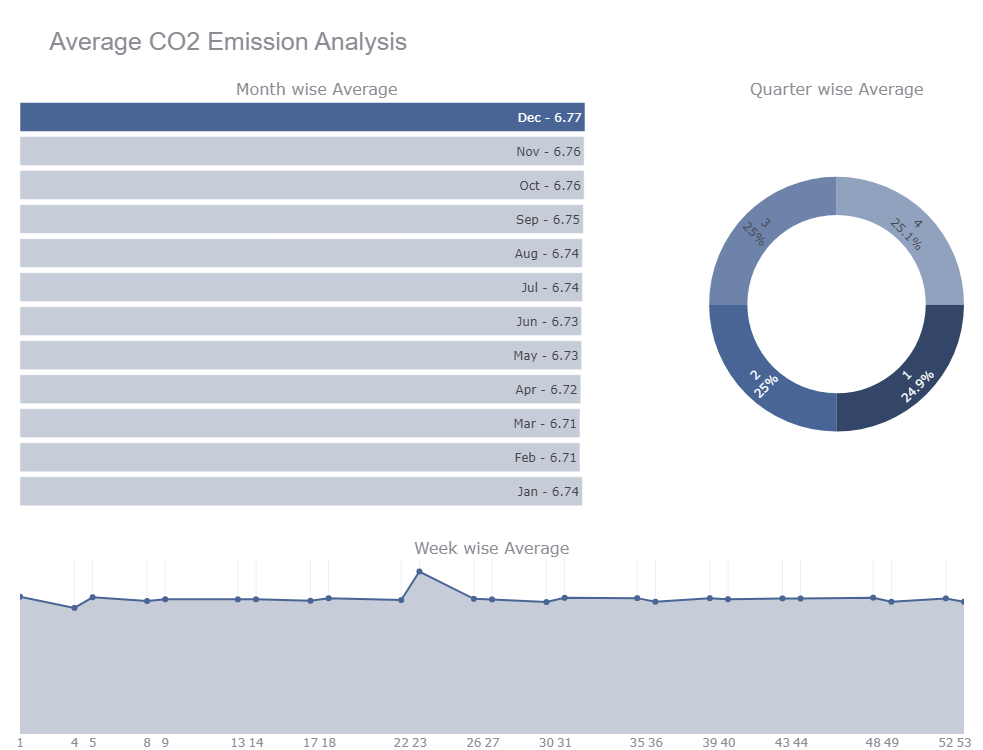

#### ^Observation: As we can observe there is Weekly seasonality in our time series data analysis.
+ Every $23^{rd}$ week of every Year we can see a spike in CO2 emission in our time series
+ It does not have Quarterly or Monthly seasonality  thorugh out the years. 

In [ ]:
# data
df_dw_sa = visual.groupby('day_of_week').agg({"CO2" : "mean"}).reset_index()
df_dw_sa.CO2 = round(df_dw_sa.CO2, 2)

# chart
fig = px.bar(df_dw_sa, y='day_of_week', x='CO2', title='Avg CO2 Emission vs Day of Week',
             color_discrete_sequence=['#c6ccd8'], text='CO2',
             category_orders=dict(day_of_week=["Monday","Tuesday","Wednesday","Thursday", "Friday","Saturday","Sunday"]))
fig.update_yaxes(showgrid=False, ticksuffix=' ', showline=False)
fig.update_xaxes(visible=False)
fig.update_layout(margin=dict(t=60, b=0, l=0, r=0), height=350,
                  hovermode="y unified", 
                  yaxis_title=" ", template='plotly_white',
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#c6ccd8", font_size=13, font_family="Lato, sans-serif"))

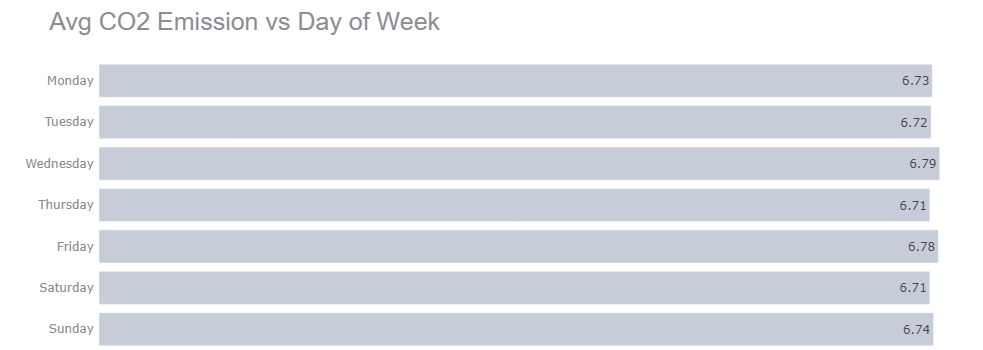

#### ^Observation: In daily analysis of $CO_2$ emission we are getting a constant variation among all days throughout the Years
+ **Hence, we can see there is no Daily seasonality or pattern in CO2 emission**

In [16]:
year = visual[['CO2',"year"]]

In [17]:
lst = [year]
for column in lst:
    column.loc[column["year"] <= 1900,  'Century'] = '1800'
    column.loc[(column["year"] >= 1900) & (column["year"] <= 2000), 'Century'] = '1900'
    column.loc[(column["year"] >= 2000) & (column["year"] <= 2014), 'Century'] = '2000'
for column in lst:
    column.loc[column["year"] <= 1810,  'Decade'] = "1810"
    column.loc[(column["year"] >= 1810) & (column["year"] <= 1820), 'Decade'] = '1820'
    column.loc[(column["year"] >= 1820) & (column["year"] <= 1830), 'Decade'] = '1830'
    column.loc[(column["year"] >= 1830) & (column["year"] <= 1840), 'Decade'] = '1840'
    column.loc[(column["year"] >= 1840) & (column["year"] <= 1850), 'Decade'] = '1850'
    column.loc[(column["year"] >= 1850) & (column["year"] <= 1860), 'Decade'] = '1860'
    column.loc[(column["year"] >= 1860) & (column["year"] <= 1870), 'Decade'] = '1870'
    column.loc[(column["year"] >= 1870) & (column["year"] <= 1880), 'Decade'] = '1880'
    column.loc[(column["year"] >= 1880) & (column["year"] <= 1890), 'Decade'] = '1890'
    column.loc[(column["year"] >= 1890) & (column["year"] <= 1900), 'Decade'] = '1900'
    column.loc[(column["year"] >= 1900) & (column["year"] <= 1910), 'Decade'] = '1910'
    column.loc[(column["year"] >= 1910) & (column["year"] <= 1920), 'Decade'] = '1920'
    column.loc[(column["year"] >= 1920) & (column["year"] <= 1930), 'Decade'] = '1930'
    column.loc[(column["year"] >= 1930) & (column["year"] <= 1940), 'Decade'] = '1940'
    column.loc[(column["year"] >= 1940) & (column["year"] <= 1950), 'Decade'] = '1950'
    column.loc[(column["year"] >= 1950) & (column["year"] <= 1960), 'Decade'] = '1960'
    column.loc[(column["year"] >= 1960) & (column["year"] <= 1970), 'Decade'] = '1970'
    column.loc[(column["year"] >= 1970) & (column["year"] <= 1980), 'Decade'] = '1980'
    column.loc[(column["year"] >= 1980) & (column["year"] <= 1990), 'Decade'] = '1990'
    column.loc[(column["year"] >= 1990) & (column["year"] <= 2000), 'Decade'] = '2000'
    column.loc[(column["year"] >= 2000) & (column["year"] <= 2014), 'Decade'] = '2010'

In [20]:
year

,CO2,year,Century,Decade
0,0.005680,1800,1800,1810
1,0.005674,1800,1800,1810
2,0.005668,1800,1800,1810
3,0.005662,1800,1800,1810
4,0.005657,1800,1800,1810
...,...,...,...,...
2564,14.966667,2013,2000,2010
2565,15.000000,2013,2000,2010
2566,15.033333,2013,2000,2010
2567,15.066667,2013,2000,2010


In [21]:
year.to_csv('Visual_CO2_1.csv', index = False)

In [14]:
year.groupby('Century').agg({"CO2" : "mean"}).reset_index()

,Century,CO2
0,1800.0,0.561561
1,1900.0,11.561727
2,2000.0,16.346348


In [19]:
decade = year.groupby('Decade').min()
decade

,CO2,year,Century
Decade,,,
1810,0.005046,1800,1800.0
1820,0.004178,1810,1800.0
1830,0.003059,1820,1800.0
1840,0.002107,1830,1800.0
1850,0.001750,1840,1800.0
1860,0.023600,1850,1800.0
1870,0.118000,1860,1800.0
1880,0.321000,1870,1800.0
1890,1.200000,1880,1800.0


In [18]:
decade = year.groupby('Decade').max()
decade

,CO2,year,Century
Decade,,,
1810,0.005680,1809,1800.0
1820,0.005040,1819,1800.0
1830,0.004170,1829,1800.0
1840,0.003050,1839,1800.0
1850,0.023277,1849,1800.0
1860,0.116437,1859,1800.0
1870,0.436000,1869,1800.0
1880,1.141227,1879,1800.0
1890,2.770000,1889,1800.0


In [15]:
decade = year.groupby('Decade').agg({"CO2" : "mean"}).reset_index()

,Decade,CO2
0,1810,0.005361
1,1820,0.004644
2,1830,0.003618
3,1840,0.002552
4,1850,0.008499
5,1860,0.057693
6,1870,0.247127
7,1880,0.482152
8,1890,1.895399
9,1900,2.908567


In [16]:
decade = year.groupby('Decade').agg({"CO2" : "mean"}).reset_index()
decade

,Decade,CO2
0,1810,0.005361
1,1820,0.004644
2,1830,0.003618
3,1840,0.002552
4,1850,0.008499
5,1860,0.057693
6,1870,0.247127
7,1880,0.482152
8,1890,1.895399
9,1900,2.908567


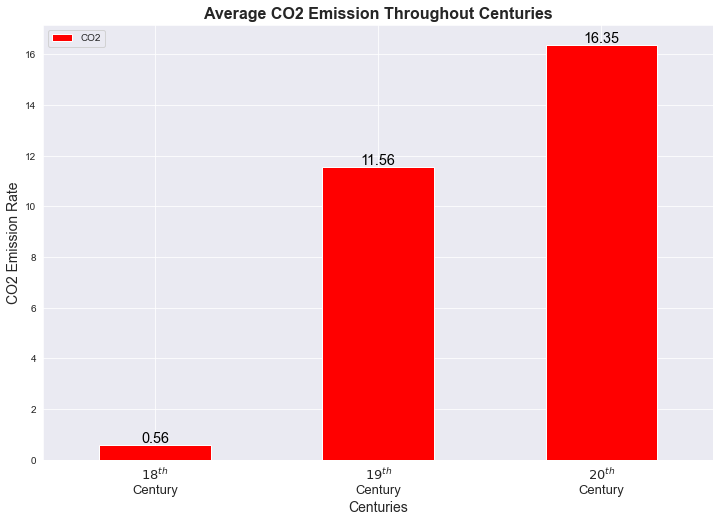

In [16]:
century = year.groupby('Century').agg({"CO2" : "mean"}).reset_index() 

plot_century = century[['CO2']].plot(kind = 'bar', figsize=(12,8),color = ('red'))
plt.xlabel('Centuries',fontsize=14)
plt.ylabel('CO2 Emission Rate',fontsize=14)
plt.xticks(np.arange(3), ('$18^{th}$\nCentury', '$19^{th}$\nCentury', '$20^{th}$\nCentury'),rotation = 'horizontal',fontsize=13)
plt.title('Average CO2 Emission Throughout Centuries',fontsize=16, fontweight='bold')
# label the bar
for rec, label in zip(plot_century.patches,
                      century['CO2'].round(2).astype(str)):
    plot_century.text(rec.get_x() + rec.get_width()/2, 
                      rec.get_height() + 0.1, 
                      label+'',  
                      ha = 'center', 
                      color = 'black',
                     fontsize='x-large'
                     )
plt.show()

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


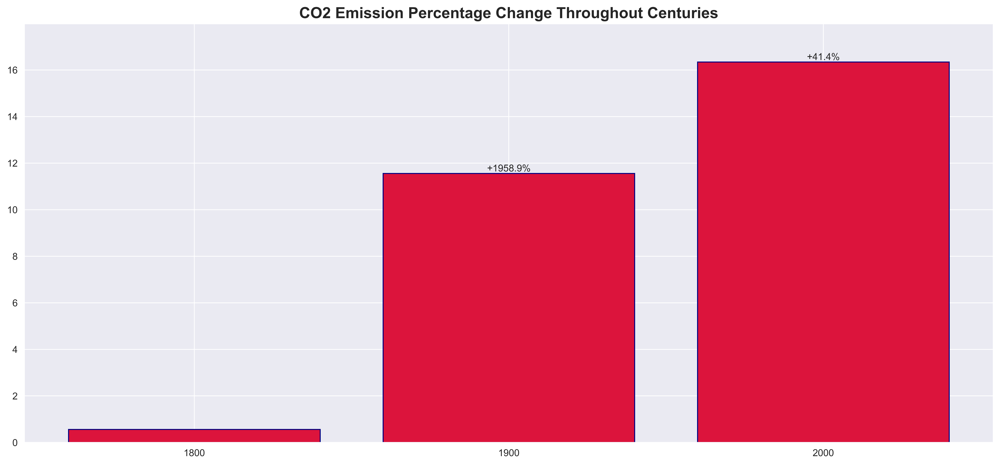

In [27]:
century = year.groupby('Century').agg({"CO2" : "mean"}).reset_index() 

plt.figure(figsize=(18,8), dpi=500)
bars = plt.bar(century.Century, century.CO2, fc='crimson', ec='navy')
plt.bar_label(bars, [''] + [f'{(y1 - y0) / y0 * 100:+.1f}%' for y0, y1 in zip(century.CO2[:-1], century.CO2[1:])])
plt.margins(y=0.1)
plt.title('CO2 Emission Percentage Change Throughout Centuries',fontsize=16, fontweight='bold')
plt.show()

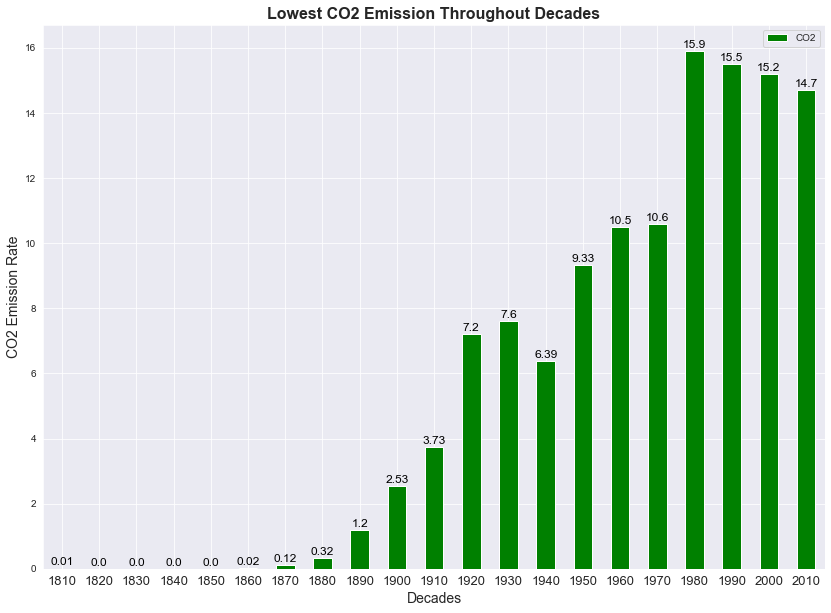

In [29]:
decade = year.groupby('Decade').min().reset_index()

plot_decade = decade[['CO2']].plot(kind = 'bar', figsize=(14,10),color = ('green'))
plt.xlabel('Decades',fontsize=14)
plt.ylabel('CO2 Emission Rate',fontsize=14)
plt.xticks(np.arange(21), labels=(decade.Decade),rotation = 'horizontal',fontsize=13)
plt.title('Lowest CO2 Emission Throughout Decades',fontsize=16, fontweight='bold')
# label the bar
for rec, label in zip(plot_decade.patches,
                      decade['CO2'].round(2).astype(str)):
    plot_decade.text(rec.get_x() + rec.get_width()/2, 
                      rec.get_height() + 0.1, 
                      label+'',  
                      ha = 'center', 
                      color = 'black',
                     fontsize='large')
plt.show()

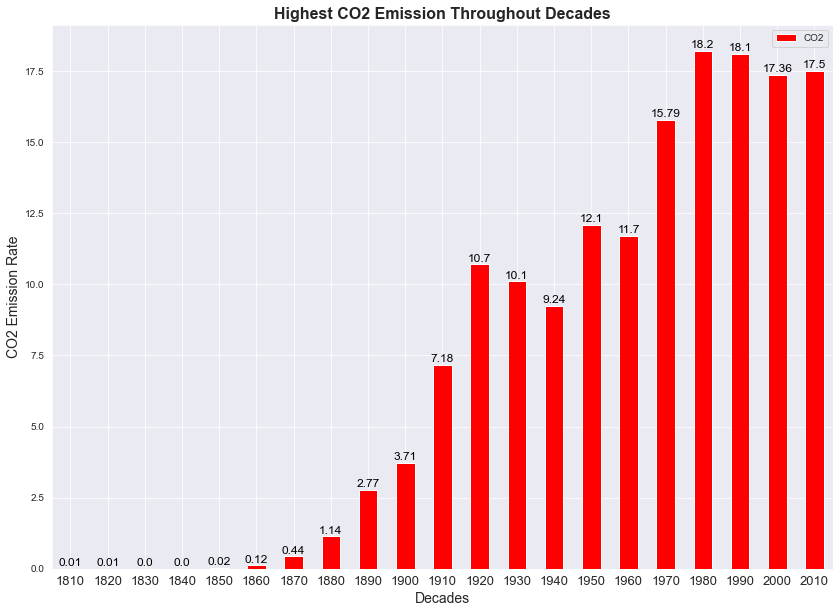

In [23]:
decade = year.groupby('Decade').max().reset_index()

plot_decade = decade[['CO2']].plot(kind = 'bar', figsize=(14,10),color = ('red'))
plt.xlabel('Decades',fontsize=14)
plt.ylabel('CO2 Emission Rate',fontsize=14)
plt.xticks(np.arange(21), labels=(decade.Decade),rotation = 'horizontal',fontsize=13)
plt.title('Highest CO2 Emission Throughout Decades',fontsize=16, fontweight='bold')
# label the bar
for rec, label in zip(plot_decade.patches,
                      decade['CO2'].round(2).astype(str)):
    plot_decade.text(rec.get_x() + rec.get_width()/2, 
                      rec.get_height() + 0.1, 
                      label+'',  
                      ha = 'center', 
                      color = 'black',
                     fontsize='large')
plt.show()

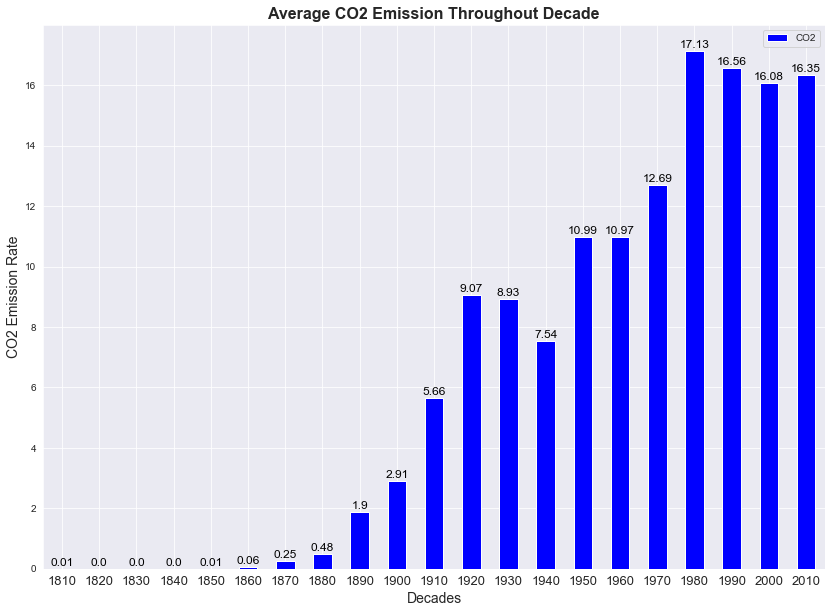

In [31]:
decade = year.groupby('Decade').agg({"CO2" : "mean"}).reset_index() 

plot_decade = decade[['CO2']].plot(kind = 'bar', figsize=(14,10),color = ('blue'))
plt.xlabel('Decades',fontsize=14)
plt.ylabel('CO2 Emission Rate',fontsize=14)
plt.xticks(np.arange(21), labels=(decade.Decade),rotation = 'horizontal',fontsize=13)
plt.title('Average CO2 Emission Throughout Decade',fontsize=16, fontweight='bold')
# label the bar
for rec, label in zip(plot_decade.patches,
                      decade['CO2'].round(2).astype(str)):
    plot_decade.text(rec.get_x() + rec.get_width()/2, 
                      rec.get_height() + 0.1, 
                      label+'',  
                      ha = 'center', 
                      color = 'black',
                     fontsize='large')
plt.show()

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


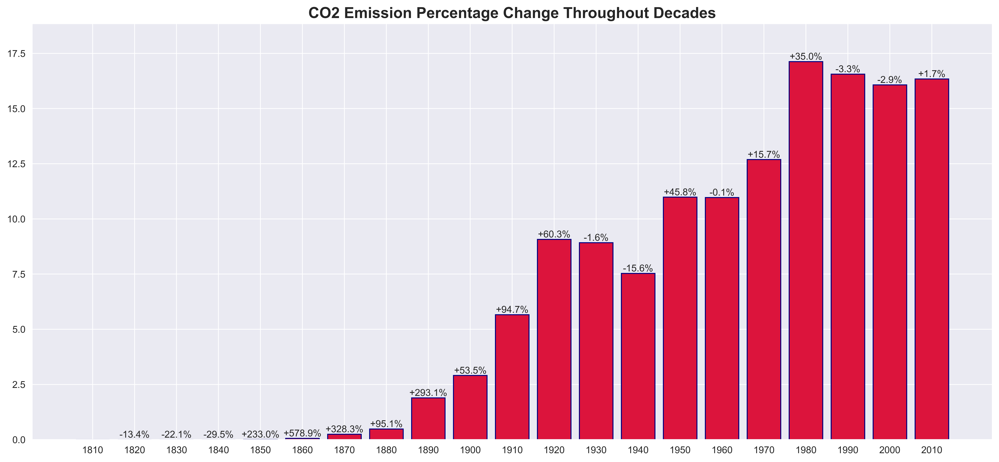

In [52]:
plt.figure(figsize=(18,8), dpi=500)
bars = plt.bar(decade.Decade, decade.CO2, fc='crimson', ec='navy')
plt.bar_label(bars, [''] + [f'{(y1 - y0) / y0 * 100:+.1f}%' for y0, y1 in zip(decade.CO2[:-1], decade.CO2[1:])])
plt.margins(y=0.1)
plt.title('CO2 Emission Percentage Change Throughout Decades',fontsize=16, fontweight='bold')
plt.show()

### Data Pre-processing for Model Driven Techniques

#### Separating Month and Year into Separate Column

#### Creating Dummy Variables of the Categorical Feature Month of Date Time feature 

In [18]:
carbon_dioxide = time.copy()
carbon_dioxide.reset_index(inplace=True)
carbon_dioxide['t'] = np.arange(1,len(carbon_dioxide)+1)
carbon_dioxide['t_squared'] = np.square(carbon_dioxide.t)
carbon_dioxide["month"] = carbon_dioxide.Year.dt.strftime("%b") # month extraction
carbon_dioxide["year"] = carbon_dioxide.Year.dt.strftime("%Y") # year extraction
months = pd.get_dummies(carbon_dioxide['month'])
months = months[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]
carbon_dioxide = pd.concat([carbon_dioxide,months],axis=1)
carbon_dioxide['log_CO2'] = np.log(carbon_dioxide['CO2'])
carbon_dioxide.to_csv('CO2_dataset_FE.csv')
carbon_dioxide

,Year,CO2,t,t_squared,month,year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,log_CO2
0,1800-01-31,0.005680,1,1,Jan,1800,1,0,0,0,0,0,0,0,0,0,0,0,-5.170804
1,1800-02-28,0.005675,2,4,Feb,1800,0,1,0,0,0,0,0,0,0,0,0,0,-5.171750
2,1800-03-31,0.005669,3,9,Mar,1800,0,0,1,0,0,0,0,0,0,0,0,0,-5.172798
3,1800-04-30,0.005663,4,16,Apr,1800,0,0,0,1,0,0,0,0,0,0,0,0,-5.173814
4,1800-05-31,0.005657,5,25,May,1800,0,0,0,0,1,0,0,0,0,0,0,0,-5.174864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2564,2013-09-30,14.965205,2565,6579225,Sep,2013,0,0,0,0,0,0,0,0,1,0,0,0,2.705728
2565,2013-10-31,14.999178,2566,6584356,Oct,2013,0,0,0,0,0,0,0,0,0,1,0,0,2.707995
2566,2013-11-30,15.032055,2567,6589489,Nov,2013,0,0,0,0,0,0,0,0,0,0,1,0,2.710185
2567,2013-12-31,15.066027,2568,6594624,Dec,2013,0,0,0,0,0,0,0,0,0,0,0,1,2.712442


<AxesSubplot:xlabel='month', ylabel='CO2'>

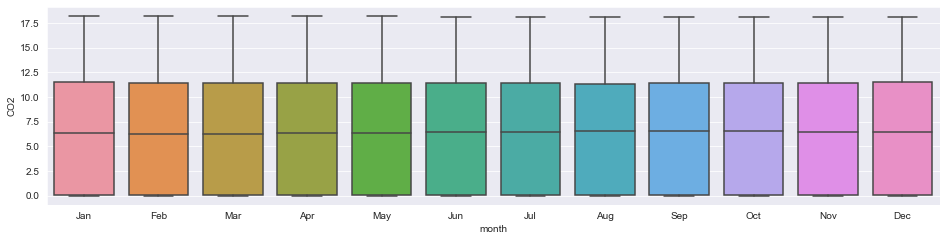

In [78]:
#### Box Plot of Each Year by Monthly Intervals

# Boxplot for ever
plt.figure(figsize=(16,8))
plt.subplot(211)
sns.boxplot(x="month",y="CO2",data=carbon_dioxide)

# Autoregressive Integrated Moving Averages (ARIMA)

Recall that an <strong>AR(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \varepsilon_{t}$

while an <strong>MA(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = \mu + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$

where $c$ is a constant, $\mu$ is the expectation of $y_{t}$ (often assumed to be zero), $\phi_1$ is the AR lag coefficient, $\theta_1$ (theta-sub-one) is the MA lag coefficient, and $\varepsilon$ (epsilon) is white noise.

An <strong>ARMA(1,1)</strong> model therefore follows

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$

### Assumptions of ARIMA model
1. **Data should be stationary** – by stationary it means that the properties of the series doesn’t depend on the time when it is captured. A white noise series and series with cyclic behavior can also be considered as stationary series.
2. **Data should be univariate** – ARIMA works on a single variable. Auto-regression is all about regression with the past values.

#### Stationary vs Non-stationary Time Series

### Test of Stationarity

##### As we have yearly data the window size for moving average is equal to 12

In [70]:
def test_stationarity(timeseries):
    
    #Determine rolling statistics
    movingAverage = timeseries.rolling(window=12).mean()
    movingSTD = timeseries.rolling(window=12).std()
    
    #Plot rolling statistics
    plt.figure(figsize=(16,6))
    orig = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(movingAverage, color='red', label='Rolling Mean')
    std = plt.plot(movingSTD, color='black', label='Rolling STD')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show(block=False)
    
    #Perform Dickey–Fuller test:
    print('Results of Dickey Fuller Test:')
    dftest = adfuller(timeseries['CO2'], autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(np.round(dfoutput,3))

#### Augmented Dicky Fuller Test
Null Hypothesis (H0): The series is not stationary

p-val > 0.05

Alternate Hypothesis (H1): The series is stationary

p-val <= 0.05

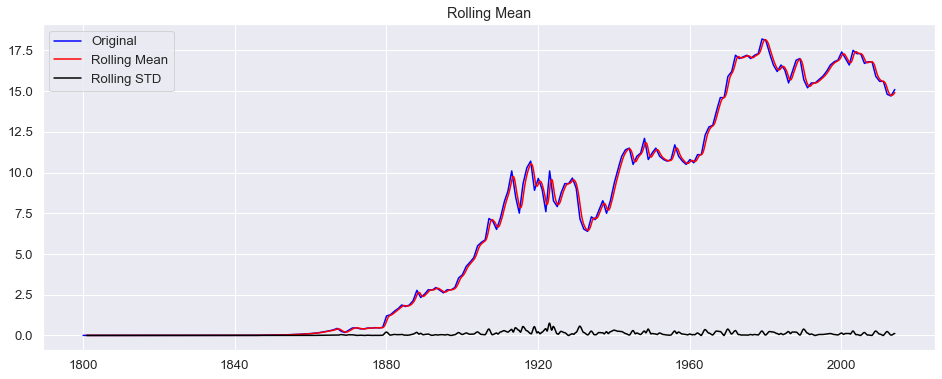

Results of Dickey Fuller Test:
Test Statistic                   -0.425
p-value                           0.906
#Lags Used                       28.000
Number of Observations Used    2540.000
Critical Value (1%)              -3.433
Critical Value (5%)              -2.863
Critical Value (10%)             -2.567
dtype: float64


In [80]:
CO= pd.DataFrame()
CO['CO2'] = time[['CO2']]
test_stationarity(CO)

In [69]:
from statsmodels.tsa.stattools import adfuller
def adf_test(series):    
    result = adfuller(series.dropna())  
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)
    #for key,val in result[4].items():
        #out[f'critical value ({key})']=val
    if result[1] <= 0.05:
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")

In [72]:
adf_test(CO)

Fail to reject the null hypothesis
Data is non-stationary


### Feature Scaling (Transformations)

#### Square Root Transform

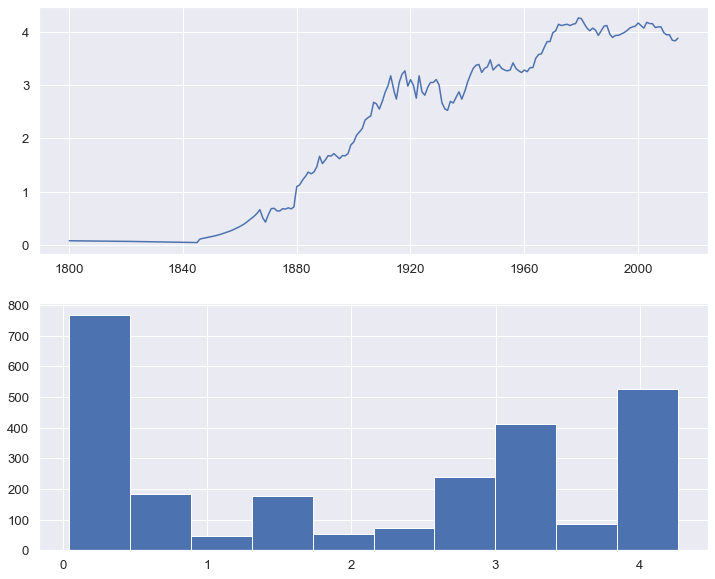

In [73]:
square_root= pd.DataFrame()
square_root = time[['CO2']]
square_root['CO2'] = np.sqrt(square_root.CO2)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(square_root['CO2'])
#Histogram
plt.subplot(212)
plt.hist(square_root['CO2'])
plt.show()

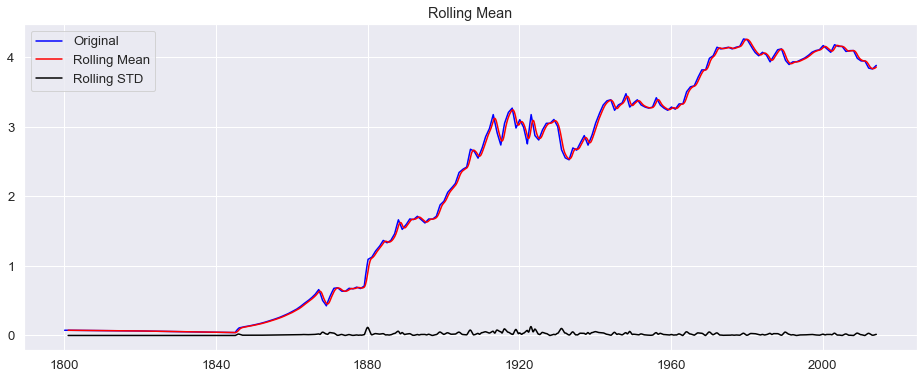

Results of Dickey Fuller Test:
Test Statistic                   -0.642781
p-value                           0.861019
#Lags Used                       28.000000
Number of Observations Used    2540.000000
Critical Value (1%)              -3.430000
Critical Value (5%)              -2.860000
Critical Value (10%)             -2.570000
dtype: float64


In [74]:
test_stationarity(square_root)

In [35]:
adf_test(square_root)

Fail to reject the null hypothesis
Data is non-stationary


#### Log Transform

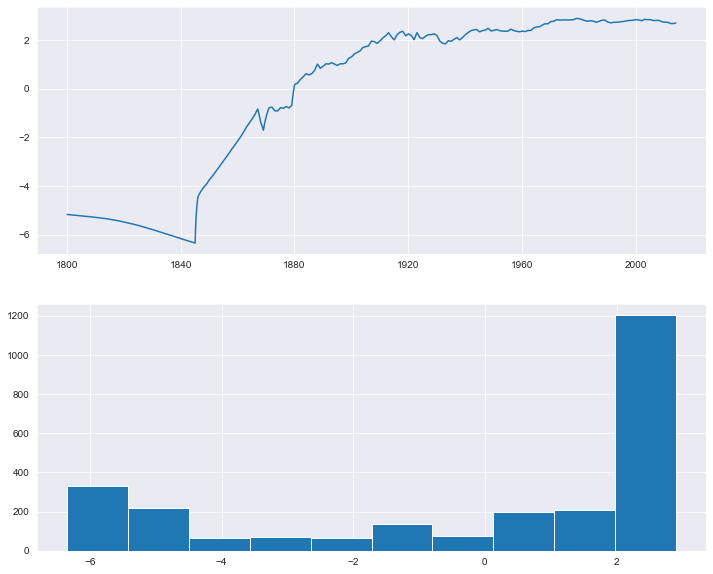

In [37]:
log = pd.DataFrame()
log = time[['CO2']]
log['CO2'] = np.log(log.CO2)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(log['CO2'])
#Histogram
plt.subplot(212)
plt.hist(log['CO2'])
plt.show()

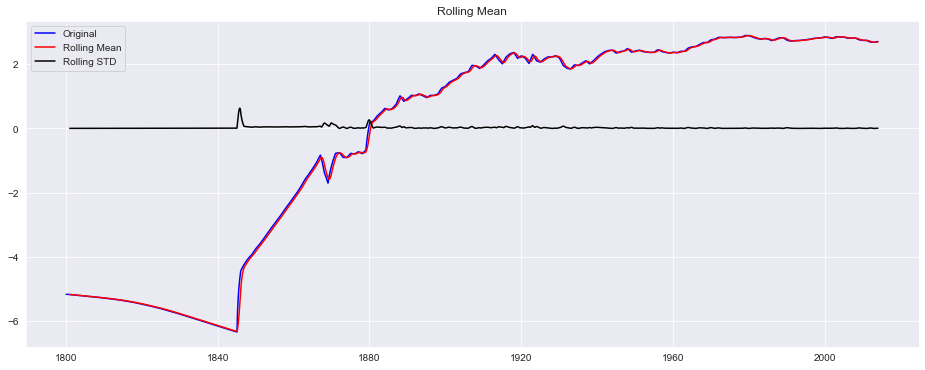

Results of Dickey Fuller Test:
Test Statistic                   -1.369782
p-value                           0.596674
#Lags Used                       13.000000
Number of Observations Used    2555.000000
Critical Value (1%)              -3.432912
Critical Value (5%)              -2.862672
Critical Value (10%)             -2.567373
dtype: float64


In [38]:
test_stationarity(log)

In [39]:
adf_test(log)

Fail to reject the null hypothesis
Data is non-stationary


##### Hence, the Time series data is Non-Stationary

### Converting Non-Stationary Time Series into Stationary

#### Differencing
In this method, we compute the difference of consecutive terms in the series. Differencing is typically performed to get rid of the varying mean. Mathematically, differencing can be written as:

yt‘ = yt – y(t-1)

where yt is the value at a time t

Applying differencing on our series and plotting the results:

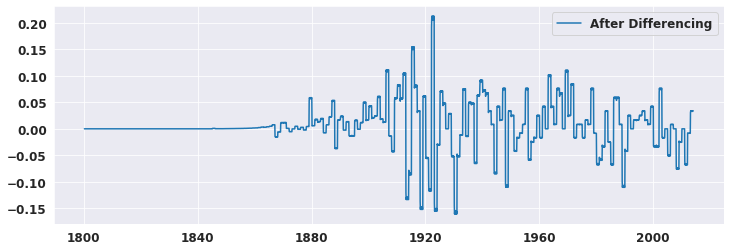

In [67]:
differencing = time - time.shift(1)
differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(differencing, label='After Differencing')
plt.legend(loc='best')
plt.show()

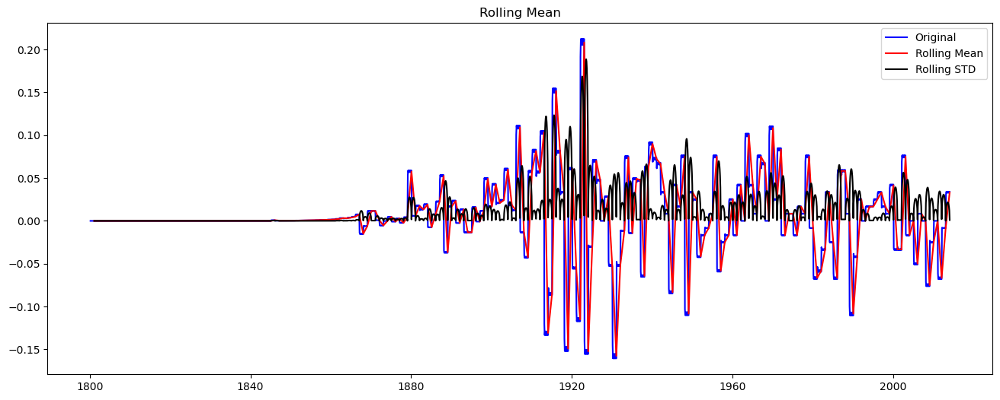

Results of Dickey Fuller Test:
Test Statistic                   -7.703
p-value                           0.000
#Lags Used                       27.000
Number of Observations Used    2540.000
Critical Value (1%)              -3.433
Critical Value (5%)              -2.863
Critical Value (10%)             -2.567
dtype: float64


In [88]:
test_stationarity(differencing)

In [42]:
adf_test(differencing)

Reject the null hypothesis
Data is stationary


#### ^Observation: Finally our data is stationary and it does not have any trend and seasonality. The data does not depend on the time when it is captured.

#### Seasonal Differencing
In seasonal differencing, instead of calculating the difference between consecutive values, we calculate the difference between an observation and a previous observation from the same season. For example, an observation taken on a Monday will be subtracted from an observation taken on the previous Monday. Mathematically it can be written as:

yt‘ = yt – y(t-n)

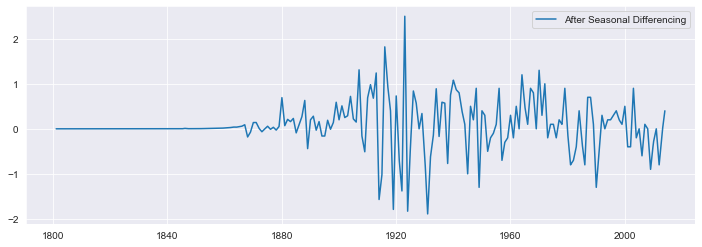

In [43]:
seasonal_differencing = time - time.shift(12)
seasonal_differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(seasonal_differencing, label='After Seasonal Differencing')
plt.legend(loc='best')
plt.show()

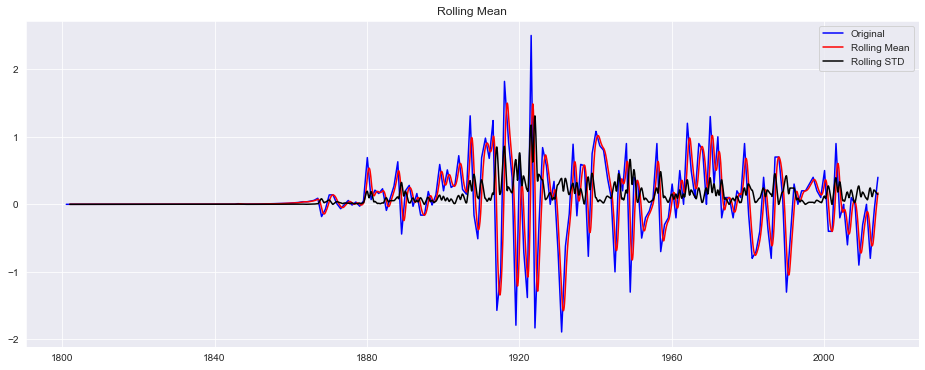

Results of Dickey Fuller Test:
Test Statistic                -8.653730e+00
p-value                        5.034132e-14
#Lags Used                     2.600000e+01
Number of Observations Used    2.530000e+03
Critical Value (1%)           -3.432937e+00
Critical Value (5%)           -2.862683e+00
Critical Value (10%)          -2.567379e+00
dtype: float64


In [44]:
test_stationarity(seasonal_differencing)

In [45]:
adf_test(seasonal_differencing)

Reject the null hypothesis
Data is stationary


#### Transformation
Transformations are used to stabilize the non-constant variance of a series. Common transformation methods include power transform, square root, and log transform. Let’s do a quick log transform and differencing on our air passenger dataset:

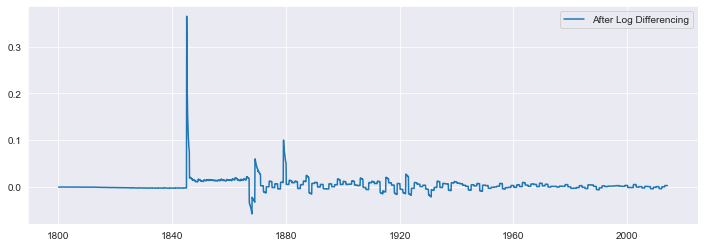

In [46]:
log_diff = log - log.shift(1)
log_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(log_diff, label='After Log Differencing')
plt.legend(loc='best')
plt.show()

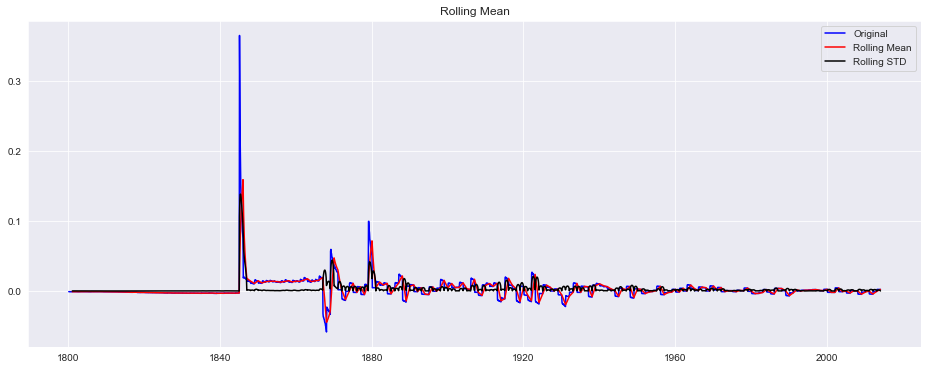

Results of Dickey Fuller Test:
Test Statistic                -1.014586e+01
p-value                        8.189697e-18
#Lags Used                     1.200000e+01
Number of Observations Used    2.555000e+03
Critical Value (1%)           -3.432912e+00
Critical Value (5%)           -2.862672e+00
Critical Value (10%)          -2.567373e+00
dtype: float64


In [47]:
test_stationarity(log_diff)

In [48]:
adf_test(log_diff)

Reject the null hypothesis
Data is stationary


#### Box Cox Transformation

,CO2
Year,
1800-01-31,-5.170804
1800-02-28,-5.171750
1800-03-31,-5.172798
1800-04-30,-5.173814
1800-05-31,-5.174864


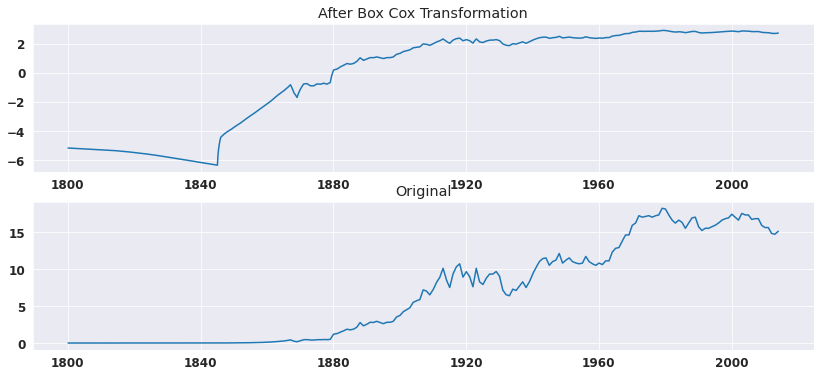

In [72]:
data_boxcox = pd.DataFrame()
data_boxcox['CO2'] = pd.Series(boxcox(time['CO2'], lmbda=0), time.index)
display(data_boxcox.head())
fig, axis = plt.subplots(2,figsize=(14,6),)
axis[0].plot(data_boxcox)
axis[0].set_title('After Box Cox Transformation')
axis[1].plot(time, label='original')
axis[1].set_title('Original')
plt.show()

#### Observation
1. We can see the variance became almost different after the transformation. Both in the earlier and later years the variance has significantly changed.
2. But we can see that still the series has an upward trend. So, the mean is not constant yet. Hence, we need to do `Differencing` for making the mean constant.

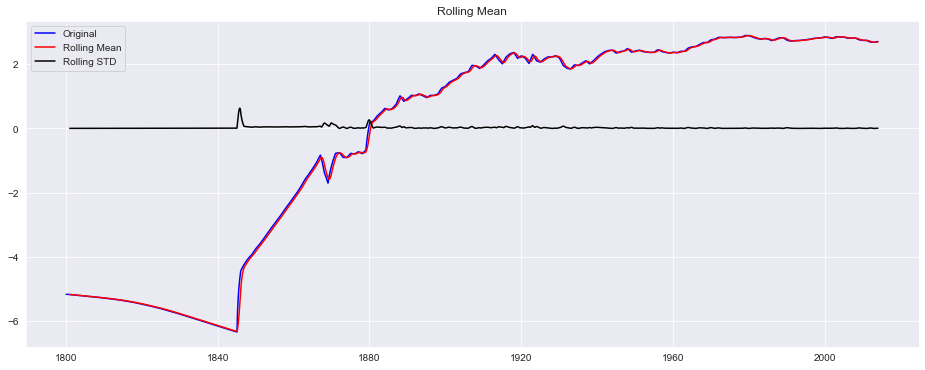

Results of Dickey Fuller Test:
Test Statistic                   -1.369782
p-value                           0.596674
#Lags Used                       13.000000
Number of Observations Used    2555.000000
Critical Value (1%)              -3.432912
Critical Value (5%)              -2.862672
Critical Value (10%)             -2.567373
dtype: float64


In [51]:
test_stationarity(data_boxcox)

In [73]:
adf_test(data_boxcox)

Fail to reject the null hypothesis
Data is non-stationary


#### Differencing of the Box-Cox Transformation
Differencing is performed by subtracting the previous observation from the current observation.

Differencing removes trend and seasonality in a Time series. When an entire cycle is used for differencing the other cycle, then the seasonality is removed.

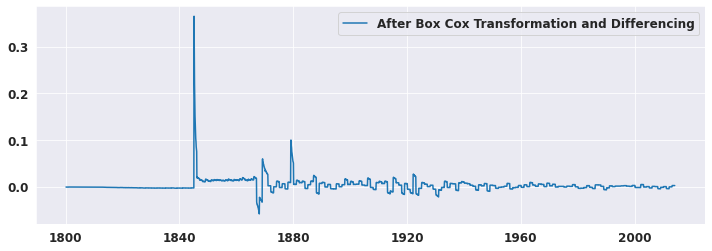

In [74]:
# data_boxcox - data_boxcox.shift() :- Performs difference between the previous and current observations.
#data_boxcox_diff = data_boxcox - data_boxcox.shift()
data_boxcox_diff = data_boxcox - data_boxcox.shift()
data_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff, label='After Box Cox Transformation and Differencing')
plt.legend(loc='best')
plt.show()

#### Observation
1. We can see that there is no trend (upward or downward) after differencing on the Box Cox transformation. 
2. It is a horizontal trend.
3. The mean became constant. The mean is zero.
4. Also, the variance is almost constant.

Lets test the Stationarity again.

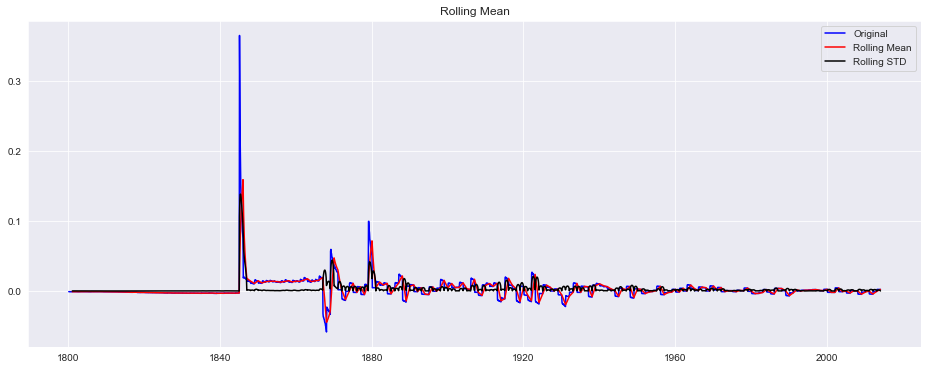

Results of Dickey Fuller Test:
Test Statistic                -1.014586e+01
p-value                        8.189697e-18
#Lags Used                     1.200000e+01
Number of Observations Used    2.555000e+03
Critical Value (1%)           -3.432912e+00
Critical Value (5%)           -2.862672e+00
Critical Value (10%)          -2.567373e+00
dtype: float64


In [54]:
#check this log transfered data with function
test_stationarity(data_boxcox_diff)

In [75]:
adf_test(data_boxcox_diff)

Reject the null hypothesis
Data is stationary


##### Finally, Our Series is now stationary for AR Forecasting

### Moving Average using Raw Dataset
#### Moving averages alone aren’t that useful for forecasting. Instead, they are mainly used for analysis. For example, moving averages help stock investors in technical analysis by smoothing out the volatility of constantly changing prices. This way, short-term fluctuations are reduced, and investors can get a more generalized picture.
#### Moving averages have the property to reduce the amount of variation present in the data. In the case of time series, this property is used to eliminate fluctuations, and the process is called smoothing of time series.

#### Math-wise, simple moving averages are dead simple to implement:
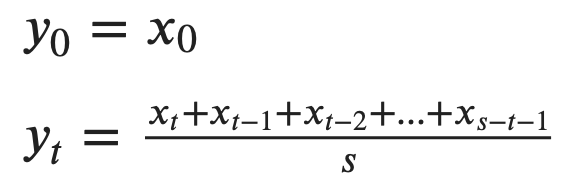

Where **`'t'`** represents the time period and **`'s'`** the size of a sliding window.

Let’s take a look at an example. $x$ will represent a sample time series without the time information, and we’ll calculate moving averages for sliding window sizes 2 and 3.

Here’s the MA(2) calculation:
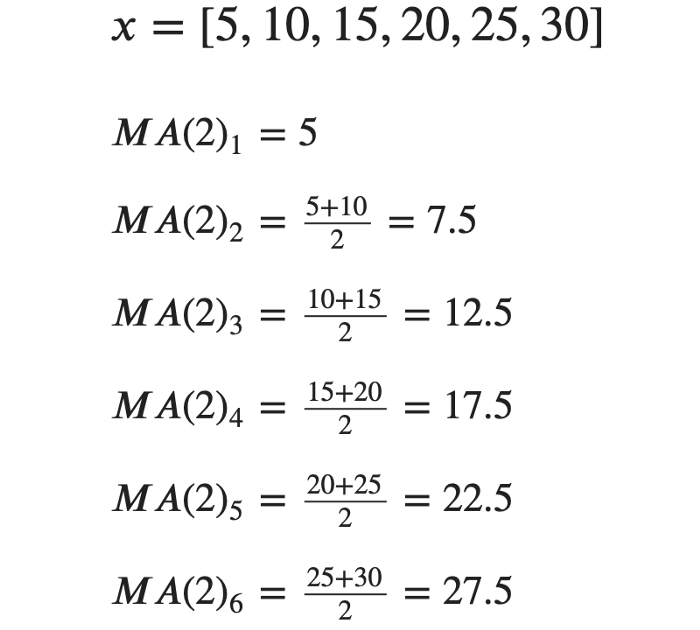

As you can see, the first data point is copied, as there’s no data point before it to calculate the average. Pandas won’t copy the value by default, but will instead return NaN. You can specify min_periods=1 inside the rolling() functions to avoid this behavior.

Here’s the MA(3) calculation:
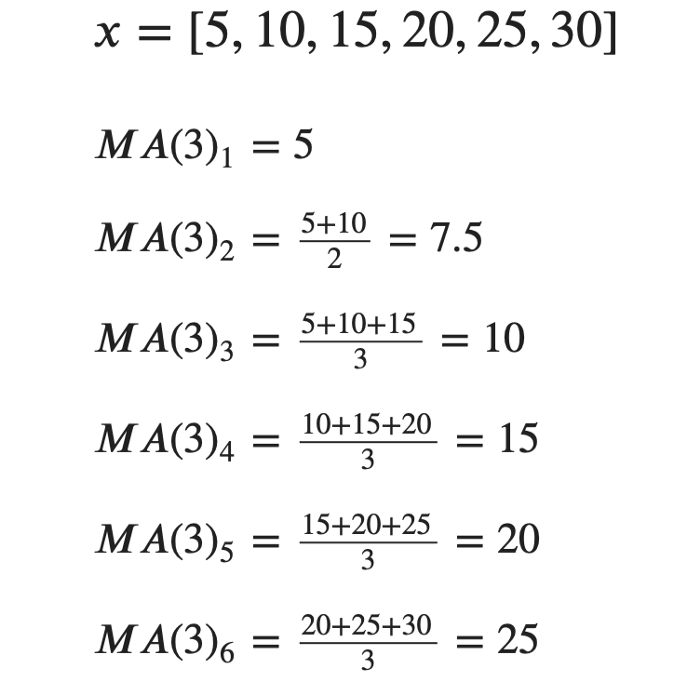

+ We can use the `rolling()` function in Pandas to calculate simple moving averages. The only parameter you should care for right now is window, as it specifies the size of a sliding window.

+ Calling `rolling()` by itself won’t do anything. You still need an aggregate function. Since these are moving averages, sticking `.mean()` to the end of a call will do.

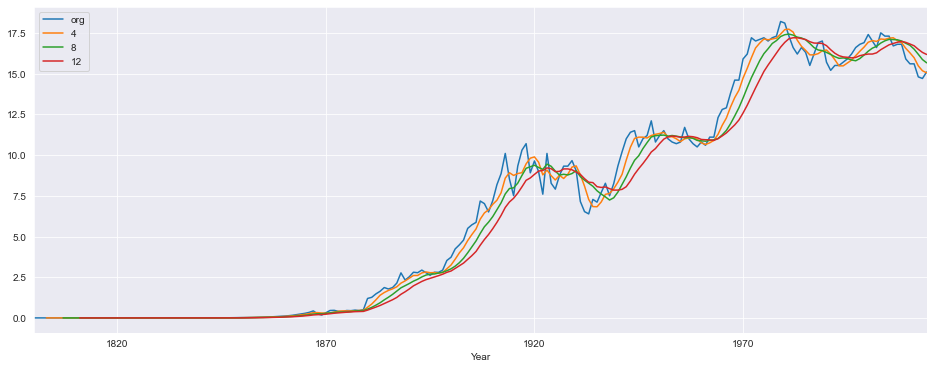

In [72]:
plt.figure(figsize=(16,6))
data.CO2.plot(label="org")
for i in range(4,13,4):
    data["CO2"].rolling(i).mean().plot(label=str(i))
plt.legend(loc='best')

#### ^Observation: Looking at the above visualization uncovers a couple of problems with simple moving averages:

+ **Lag** — moving average time series always lags from the original one. Look at the peaks to verify that claim.
+ **Noise** — too small sliding window size won’t remove all noise from the original data.
+ **Averaging issue** — averaged data will never capture the low and high points of the original series due to, well, averaging.

##### Adding insult to injury, you can’t use Pandas to forecast into the future. Instead, you’ll need to use Statsmodels for that task. Let’s see how next.

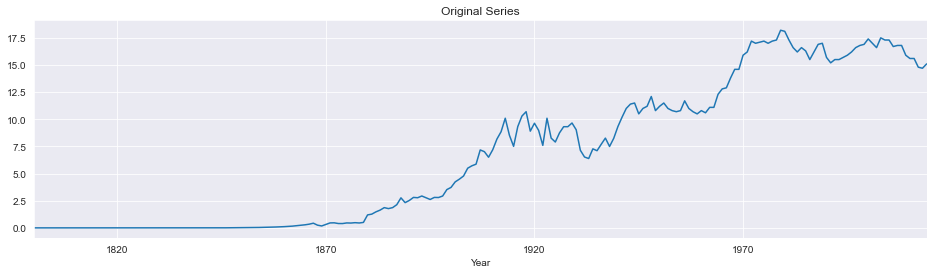

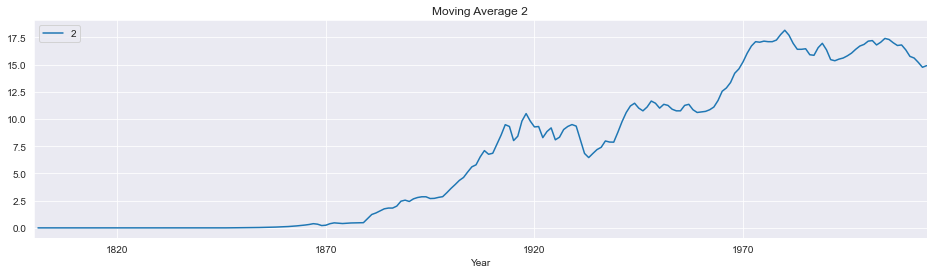

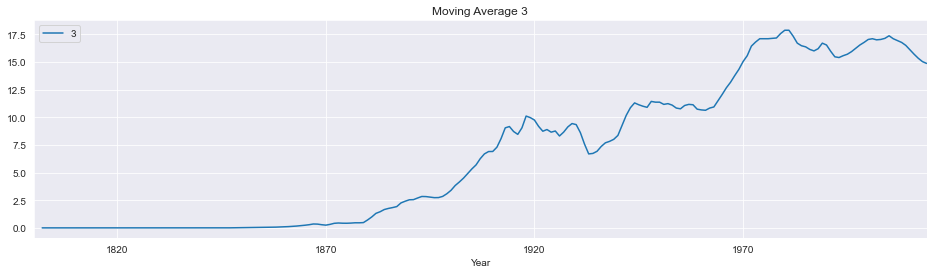

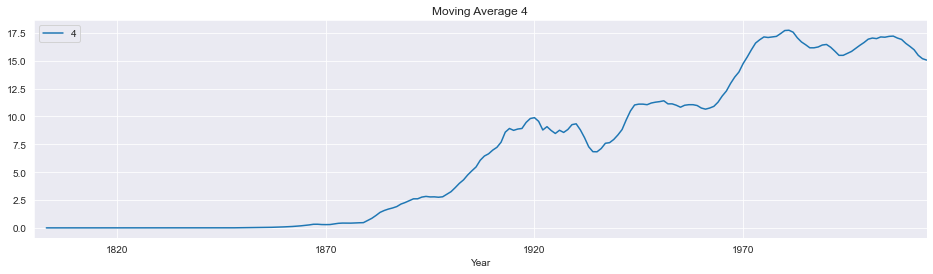

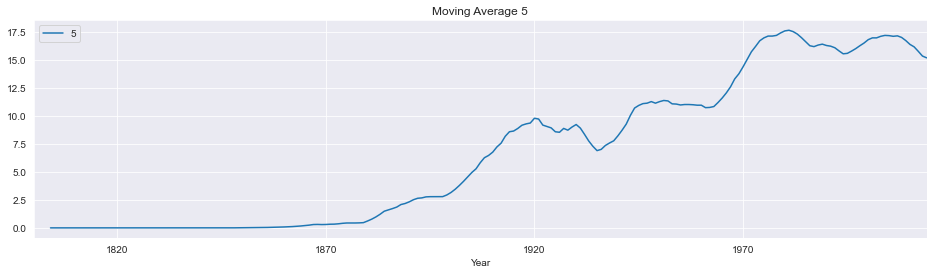

...

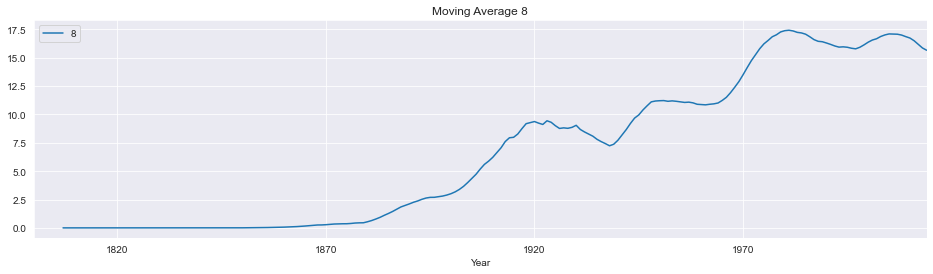

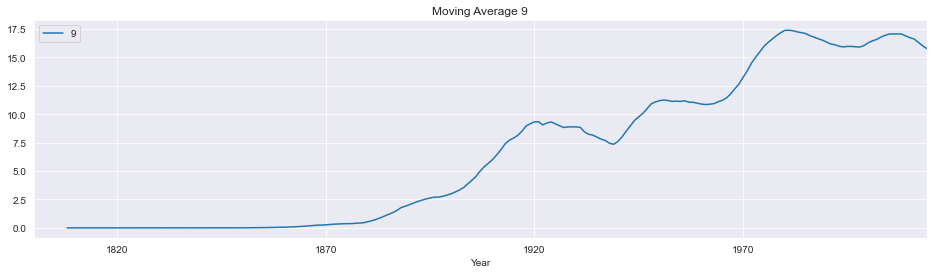

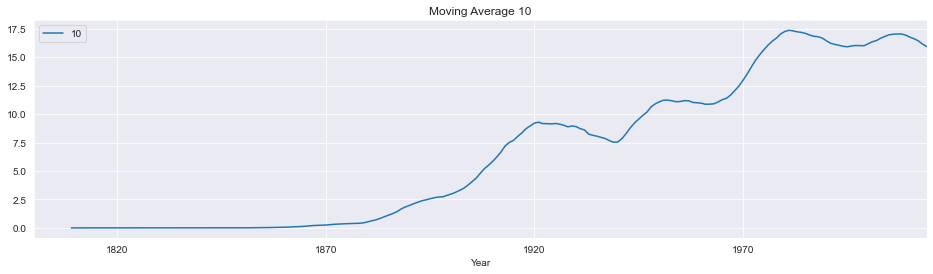

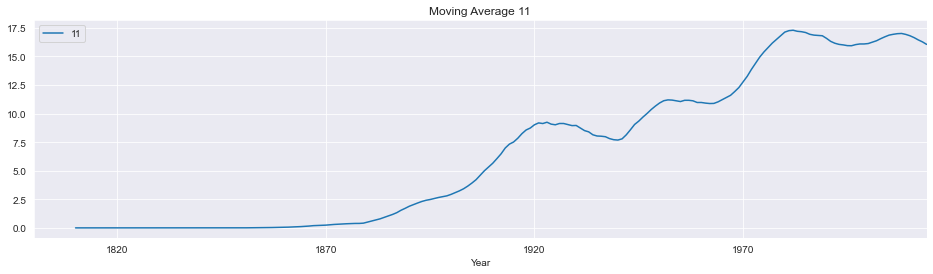

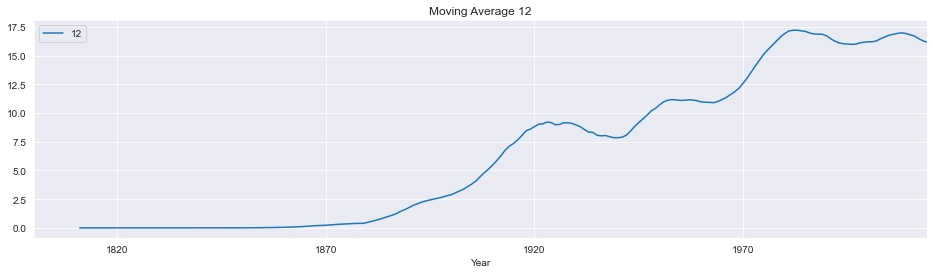

In [71]:
plt.figure(figsize=(16,4))
data.CO2.plot(label="org")
plt.title("Original Series")
for i in range(2,13):
    plt.figure(figsize=(16,4))
    data["CO2"].rolling(i).mean().plot(label=str(i))
    plt.title("Moving Average "+str(i))
    plt.legend(loc='best')
    plt.show()

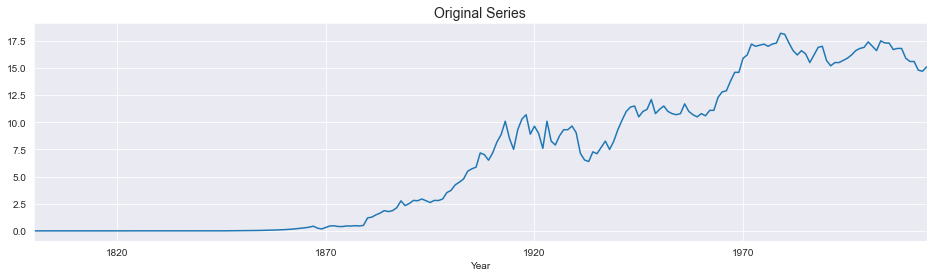

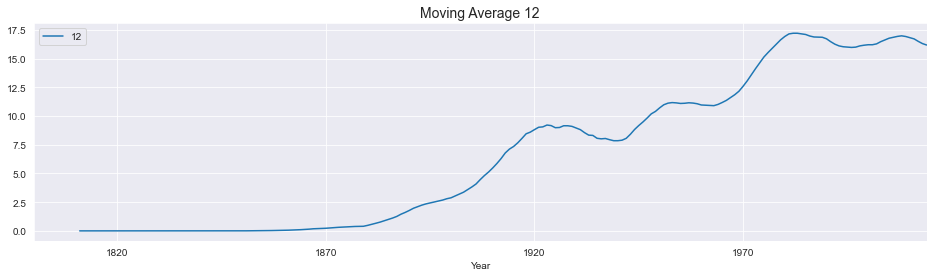

In [56]:
plt.figure(figsize=(16,4))
data.CO2.plot(label="org")
plt.title("Original Series", fontsize=14)
plt.figure(figsize=(16,4))
data["CO2"].rolling(12).mean().plot(label=str(12))
plt.title("Moving Average "+str(12), fontsize=14)
plt.legend(loc='best')
plt.show()

#### ^Observation: As we can observe there is an linear upward trend in our time series analysis
+ **Summary
A moving average is a technical indicator that investors and traders use to determine the trend direction.**

### Splitting Train and Test Data

![](https://cdn-images-1.medium.com/max/1600/1*-8_kogvwmL1H6ooN1A1tsQ.png)

#### Leaving Test Data with 30 Years of Time Series
+ **Training Data** = Fit the model only to training period. 
+ **Testing Data** = Assess the model performance on Testing. 
+ **Deploy model by training on whole dataset. No random partition That’s because the order sequence of the time series should be intact in order to use it for forecasting.**

In [78]:
time.shape

(2569, 1)

In [9]:
size = -241
train_data = time[:size]
test_data = time[size:]

In [10]:
print('Train:',train_data.index.min(),train_data.index.max(),'\n',
'Test:',test_data.index.min(),test_data.index.max())

Train: 1800-01-31 00:00:00 1983-12-31 00:00:00 
 Test: 1984-01-31 00:00:00 2014-01-31 00:00:00


### We are going to forecast for the last 20 years in test data and calculate the Metrics to select the model
### The train data contains value from 1800 to 1994. 
### The test data contains value from 1995 to 2014.

##### Last 241 records contain data from 1995 to 2014 data.

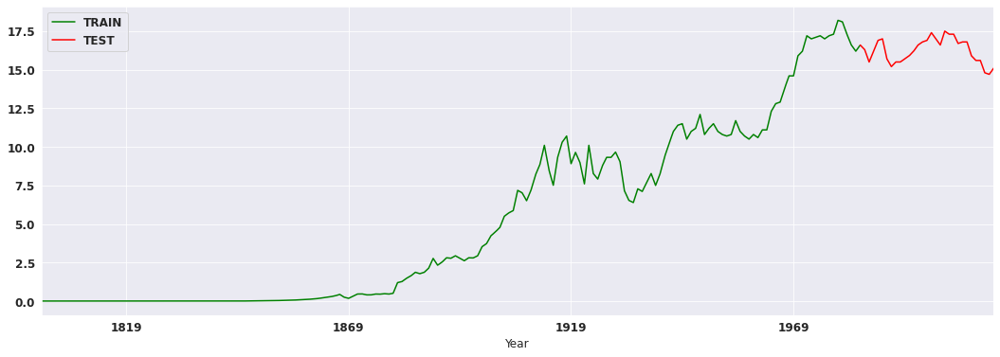

In [66]:
train_data.CO2.plot(legend=True,label='TRAIN',color='green')
test_data.CO2.plot(legend=True,label='TEST', figsize=(18,6),color='red')
plt.xlabel('Year', fontsize= 12)
plt.legend()
plt.show()

## Links for the repositories

<div style="display:fill;
            border-radius: false;
            border-style: solid;
            border-color:#000000;
            border-style: false;
            border-width: 2px;
            color:#CF673A;
            font-size:15px;
            font-family: Georgia;
            background-color:#E8DCCC;
            text-align:center;
            letter-spacing:0.1px;
            padding: 0.1em;">

**<h2>♡ Thank you for taking the time ♡**